In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import astropy.io.fits as fitsio
from astropy.coordinates import SkyCoord
import astropy.units as u

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import sys
sys.path.append('/Users/nora/projects/stream_search/code')
import plot_density
reload(plot_density)
import streamlib
reload(streamlib)
import skymap
reload(skymap)
print skymap.__version__
import galstreams

In [4]:
plot_density.plot_pretty(figsize=(18,14))

In [5]:
# def plot_streams(smap, mu, dmu=0.5, coords='cel'):
#     mw_streams = galstreams.MWStreams(verbose=False)
#     for stream in mw_streams.keys():
#         if stream in ['Her-Aq', 'EriPhe', 'Sgr-L10']:
#             continue
#         mu_stream = plot_density.dist2mod(mw_streams[stream].Rhel[0])
#         if np.abs(mu - mu_stream) < dmu:
#             # print stream, mw_streams[stream].ra.max() - mw_streams[stream].ra.min(), mw_streams[stream].dec.max(), mw_streams[stream].dec.min()
#             if coords == 'gal':
#                 x, y = smap(mw_streams[stream].l, mw_streams[stream].b)
#             else:
#                 x, y = smap(mw_streams[stream].ra, mw_streams[stream].dec)
#             smap.plot(x, y, '.', alpha=0.5)
#             plt.gca().annotate(mw_streams[stream].name, (x.min(), y.min()), color='b', fontsize=15)
            
            
# def plot_stream_list(smap, streams, coords='cel'):
#     mw_streams = galstreams.MWStreams(verbose=False)
#     for stream in streams:
#         if coords == 'gal':
#             x, y = smap(mw_streams[stream].l, mw_streams[stream].b)
#         else:
#             x, y = smap(mw_streams[stream].ra, mw_streams[stream].dec)
#         smap.plot(x, y, '.', alpha=0.5)
#         plt.gca().annotate(mw_streams[stream].name, (x.min(), y.min()), color='b', fontsize=15)
            
            
# def plot_ravi_rrl(smap, coords='cel'):
#     filename = '../data/hsoy_css_sss.gal.no_gcdw.t1d.Rg24.5-1.cmb.gc3.footprint.short.dat'
#     stream = np.genfromtxt(filename)
#     if coords == 'gal':
#         x, y = smap(stream['l'], stream['b'])
#     else:
#         x, y = smap(stream['RA'], stream['DEC'])
#     smap.plot(x, y, '.', alpha=0.5)
#     plt.gca().annotat('Ravi_RRL', (x.min(), y.min()), color='b', fontsize=15)
    
    
    

In [16]:
filename = '/Users/nora/projects/stream_search/data/iso_hpxcube_ps1_v2.fits.gz'
hpxcube, fracdet, modulus = plot_density.load_hpxcube(filename)

Reading /Users/nora/projects/stream_search/data/iso_hpxcube_ps1_v2.fits.gz...


/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:4750: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if fix_wrap_around and itemindex:
/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


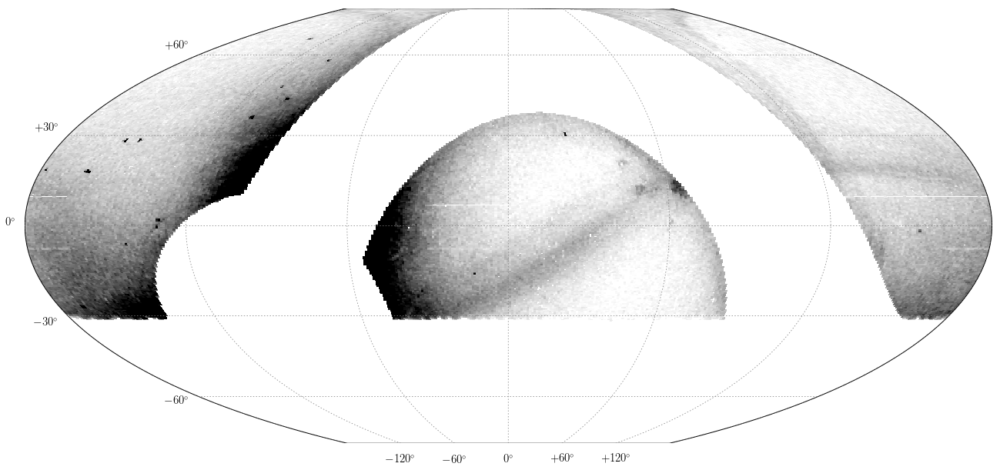

In [17]:
mu = 16.0
data, bkg = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=True, center=True, sgr=False, bmax=25, cmax=40)
smap = plot_density.plot_density(data, bkg, center=(0,30), vmax=13)

# x, y = smap(mw_streams['ATLAS'].ra, mw_streams['ATLAS'].dec)
# smap.plot(x, y, alpha=1.0, c='r')
# plot_streams(smap, mu)
# mw_streams.plot_stream_compilation(plt.gca())
# plot_density.plot_stream_list(smap, ['Ophiucus'])



In [41]:
for stream in ['ATLAS', 'Molonglo', 'Murrumbidgee', 'Orinoco', 'Kwando']:
    mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
    print stream, mu

ATLAS 16.505149978319906
Molonglo 16.505149978319906
Murrumbidgee 16.505149978319906
Orinoco 16.505149978319906
Kwando 16.505149978319906


In [44]:
bkg

/Users/nora/projects/stream_search/code/plot_density.py:141: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:141: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:141: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:141: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


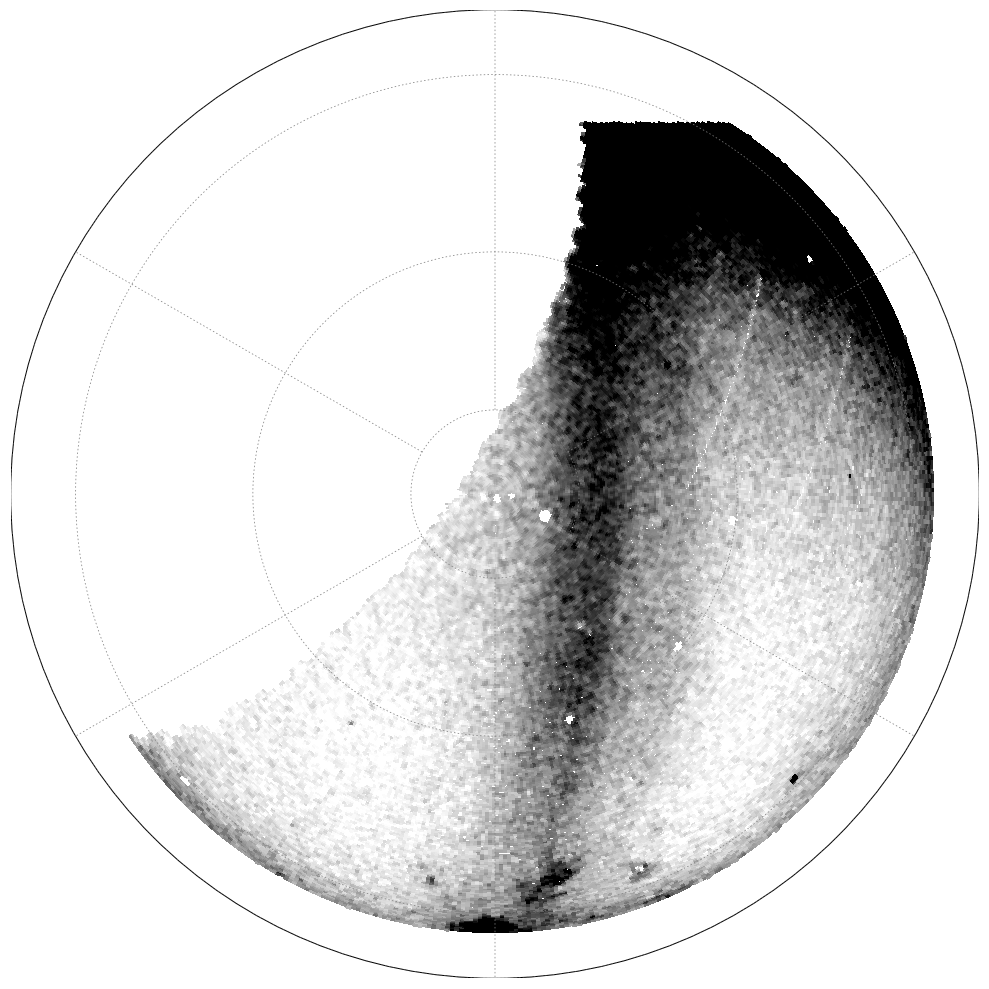

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


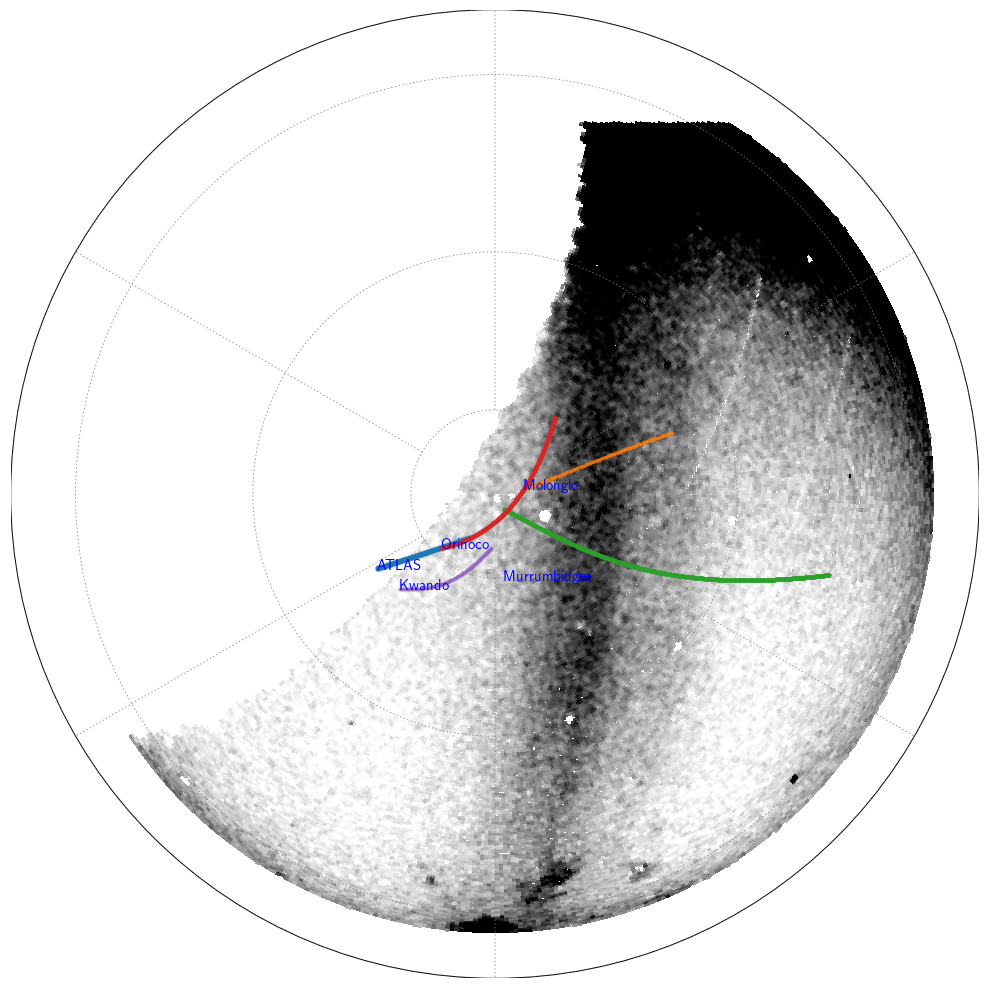

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


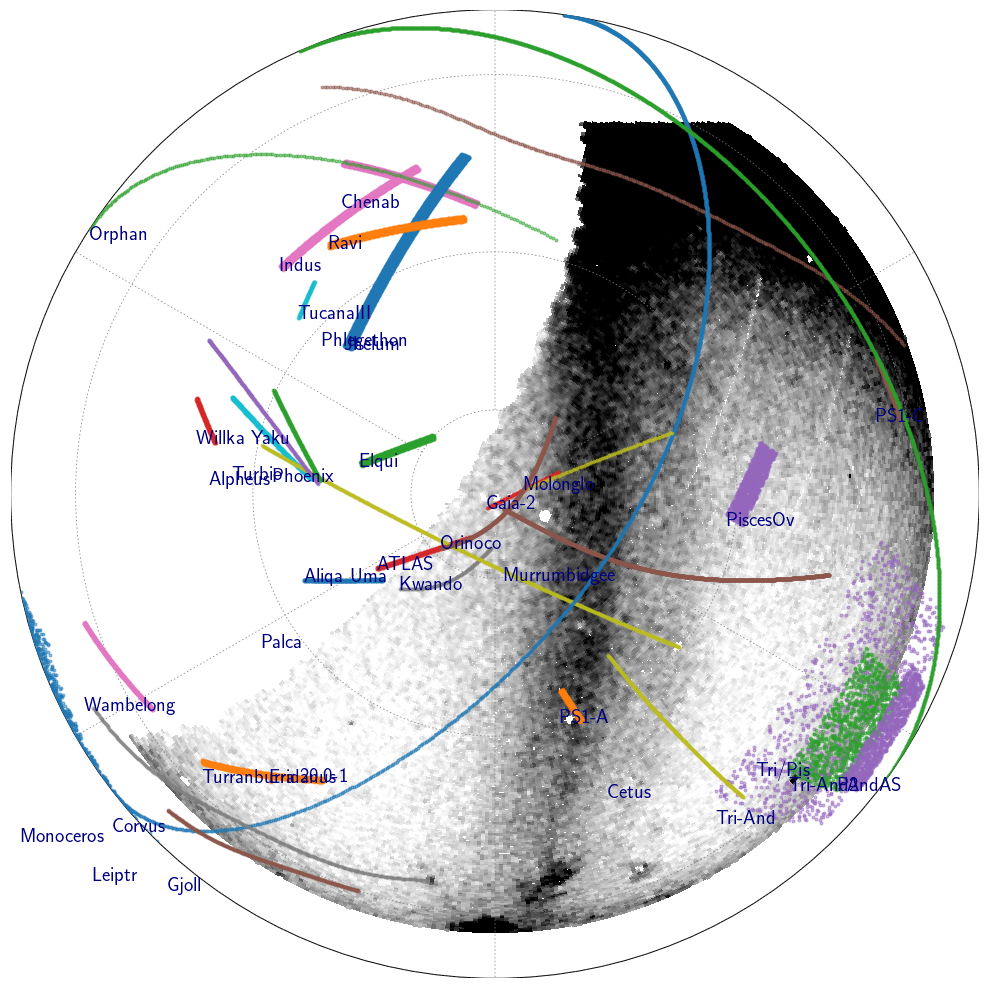

In [150]:
mu = 17
coords='gal'
lon, lat = 0, -90

# data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=True, center=True, sgr=False, bmax=25, cmax=40)
# bkg = plot_density.fit_background(data, center=center, coords='cel', sigma=0.2, deg=5)
smap = plot_density.plot_density(data, 0, center=(lon,lat), vmax=6, coords=coords, proj='ortho', xsize=600, smooth=0.2)
# plot_density.plot_streams(smap, mu, 10.0, coords=coords)
# plot_ravi_rrl(smap)
# plt.savefig('../plots/galactic_cap/galactic_cap_%.2f.png' %mu)

smap = plot_density.plot_density(data, 0, center=(lon, lat), vmax=6, coords='gal', proj='ortho', xsize=600)
plot_density.plot_stream_list(smap, ['ATLAS', 'Molonglo', 'Murrumbidgee', 'Orinoco', 'Kwando'], coords='gal')
# plt.savefig('../plots/galactic_cap/labeled/ps1_%s_%i_%i_%.2f_labeled.png' %(coords, lon, lat, mu))

smap = plot_density.plot_density(data, 0, center=(lon, lat), vmax=6, coords='gal', proj='ortho', xsize=600)
plot_density.plot_streams(smap, mu, 50, coords='gal', filename='../plots/ps1/v2/cap/cap_all_labels.png')


In [ ]:
mw_streams = galstreams.MWStreams(verbose=False)
center_ophi = (mw_streams['Ophiucus'].ra.mean(), mw_streams['Ophiucus'].dec.mean())
mu_ophi = plot_density.dist2mod(mw_streams['Ophiucus'].Rhel[0])
print center_ophi, mu_ophi
print mw_streams['Ophiucus'].b.mean()

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


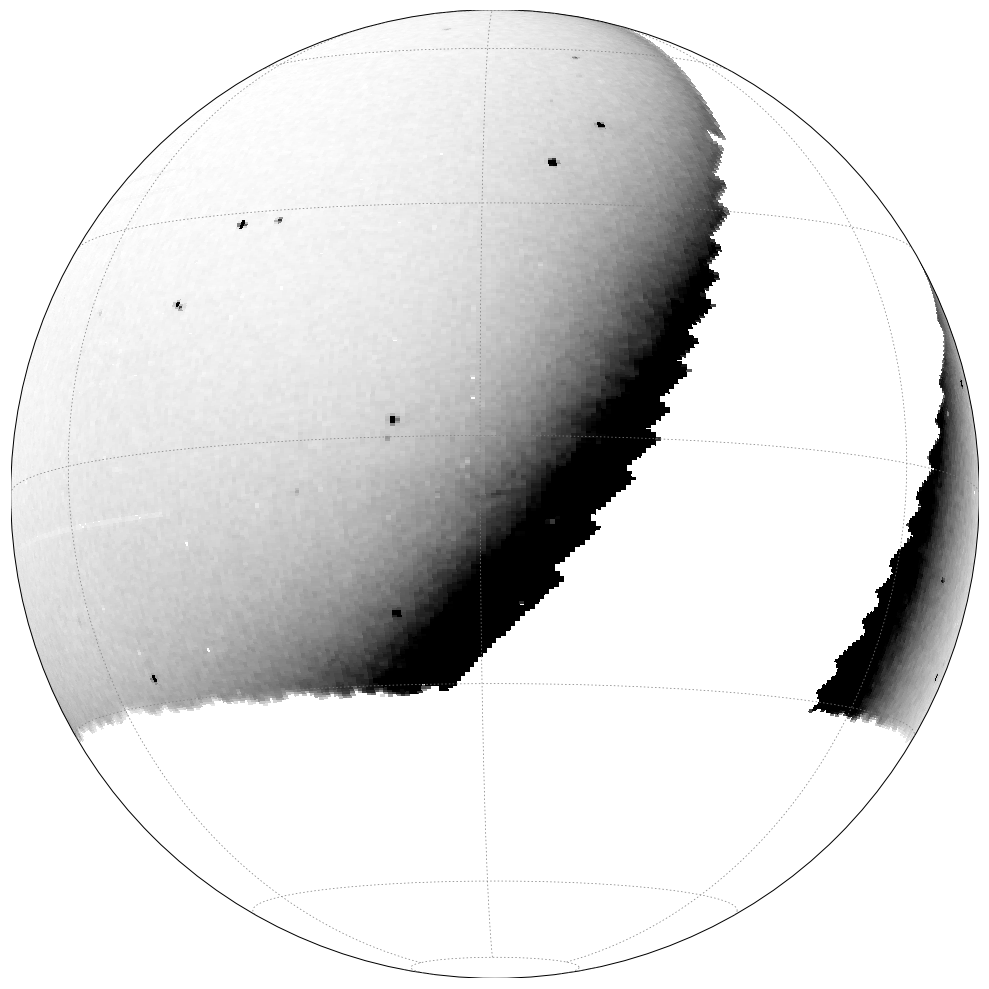

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


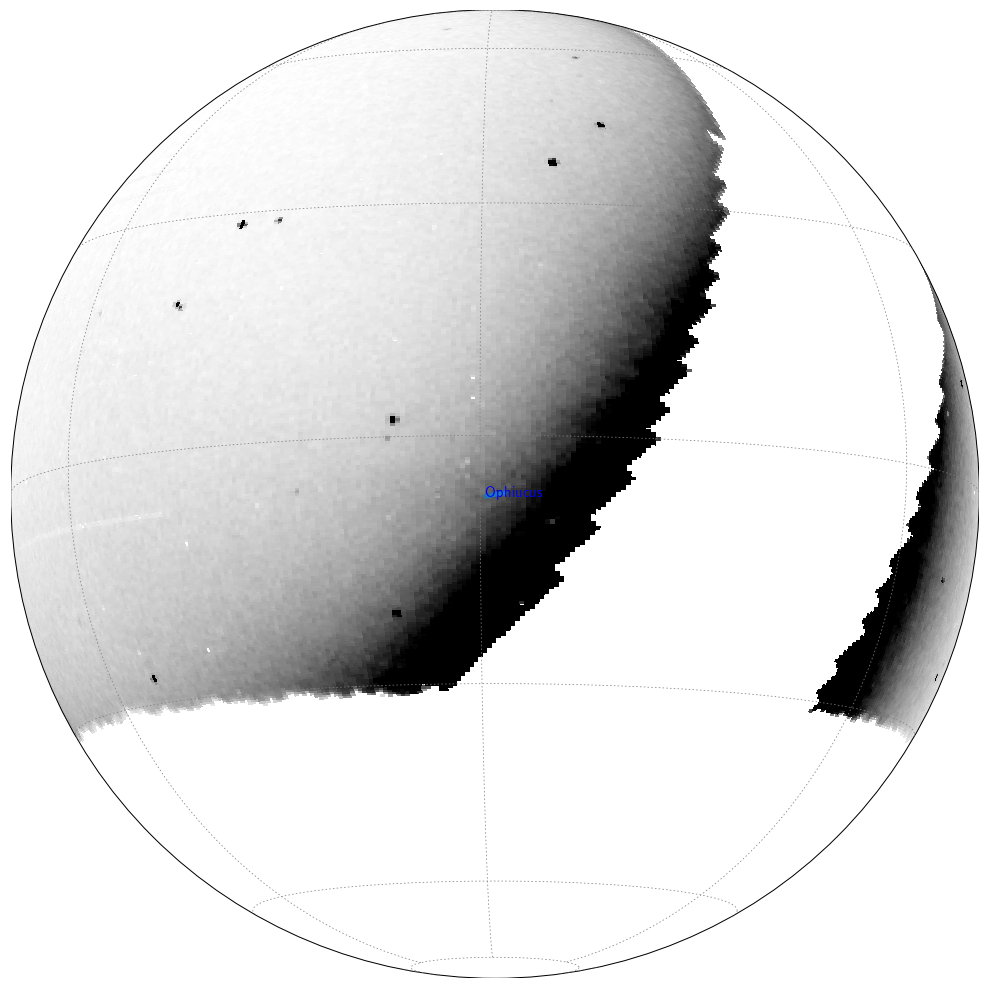

In [23]:
# mu = mu_ophi

data_ophi, bkg_ophi = plot_density.prepare_hpxmap(mu_ophi, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40)
smap = plot_density.plot_density(data_ophi, bkg_ophi, center=center_ophi, vmax=50, coords='cel', proj='ortho', xsize=600)
plt.savefig('../plots/ophiucus.png')
smap = plot_density.plot_density(data_ophi, bkg_ophi, center=center_ophi, vmax=50, coords='cel', proj='ortho', xsize=600)
plot_density.plot_stream_list(smap, ['Ophiucus'])
plt.savefig('../plots/ophiucus_labeled.png')


In [28]:
stream = 'Lethe'
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print mu

15.569716761534185


/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


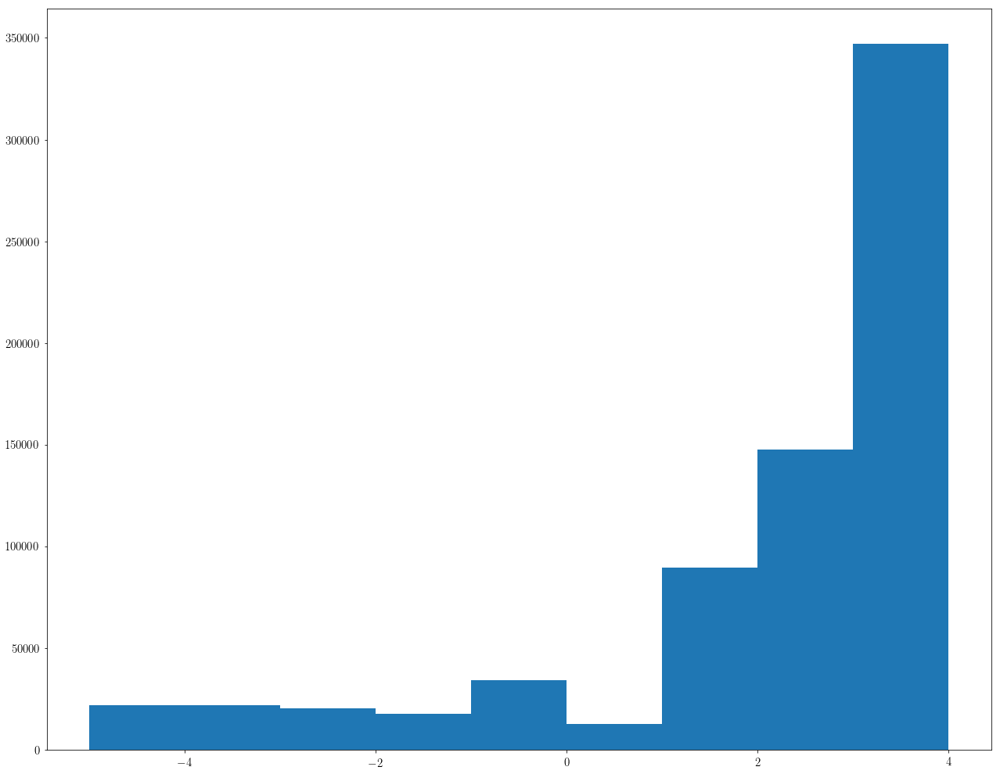

In [128]:
plt.figure()
plt.hist((data-bkg)[~data.mask], bins=np.arange(-5,5))
plt.show()

(-115.74099999999999, 27.5)
16.33585864201507


/Users/nora/projects/stream_search/code/polyfit2d.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  c = np.linalg.lstsq(vander, f)[0]
/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


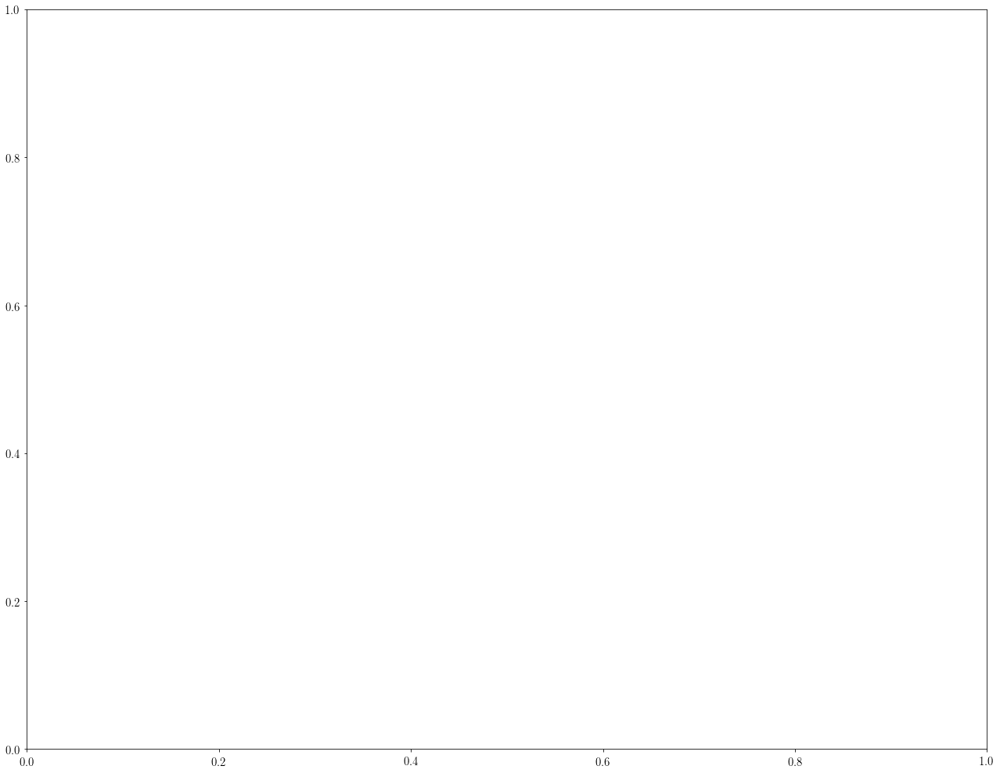

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


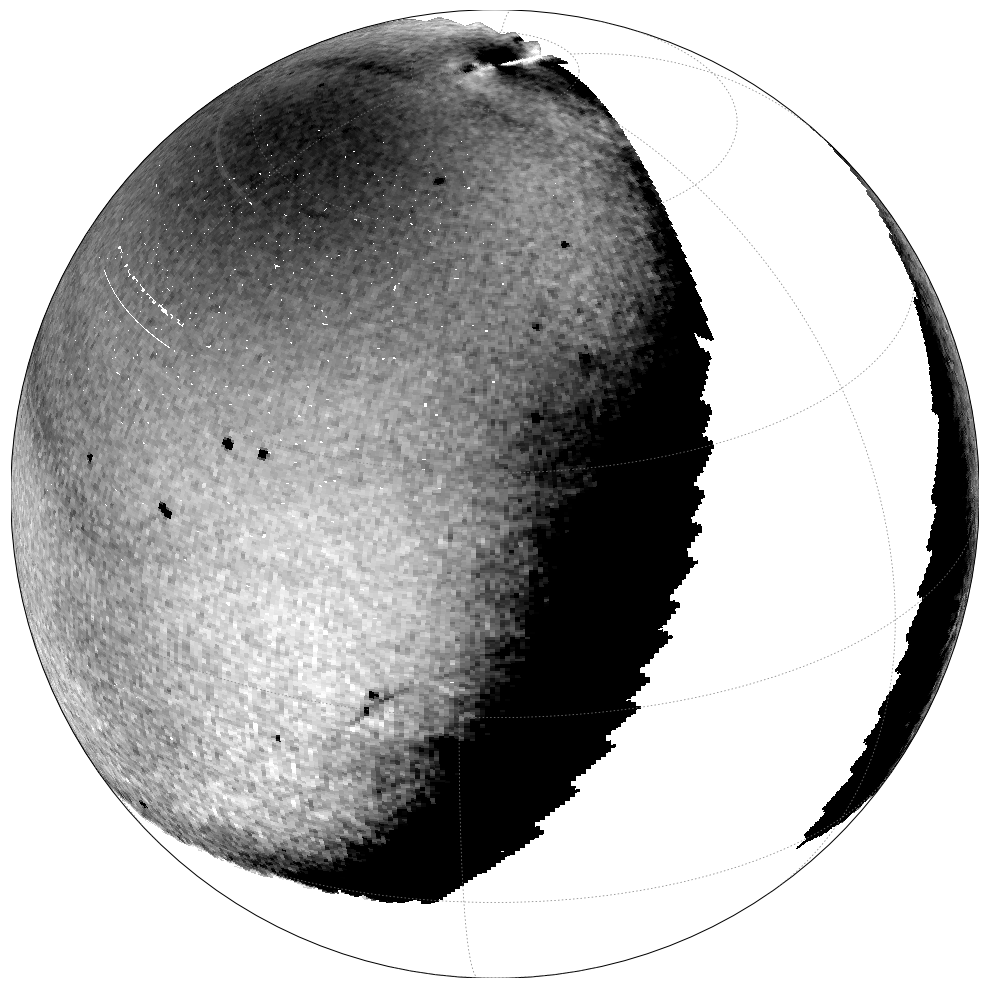

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


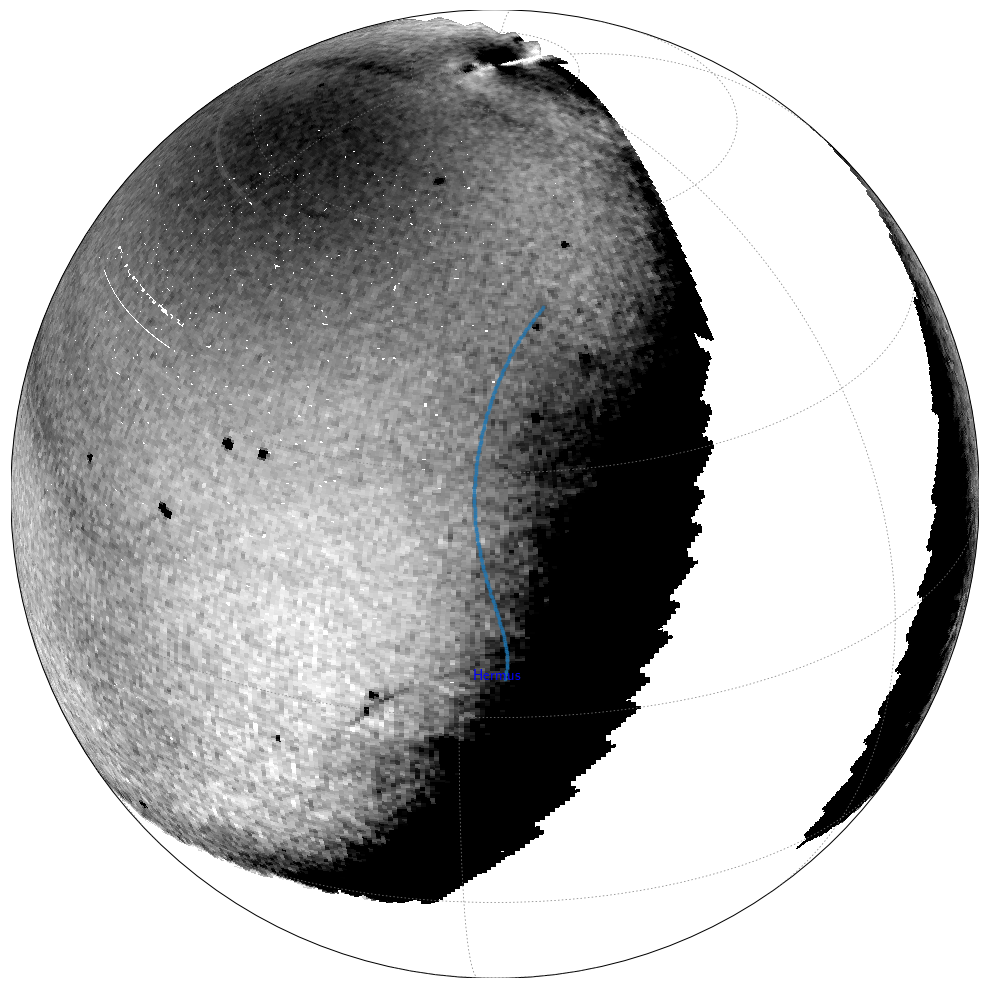

In [146]:
reload(plot_density)
reload(streamlib)

stream = 'Hermus'

# mw_streams = galstreams.MWStreams(verbose=False)
center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
if center[0] > 180:
    center = (center[0] - 360, center[1])
print center
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print mu

vmin = -4
vmax = 2

data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40)
bkg = plot_density.fit_background(data, center=center, coords='cel', sigma=0.2, deg=5)
smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords='cel', proj='ortho', xsize=600)
# smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=600)

smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords='cel', proj='ortho', xsize=600)
plot_density.plot_stream_list(smap, [stream])


(-145.66938834801826, 23.159301866662204)
15.569716761534185


/Users/nora/projects/stream_search/code/polyfit2d.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  c = np.linalg.lstsq(vander, f)[0]
/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


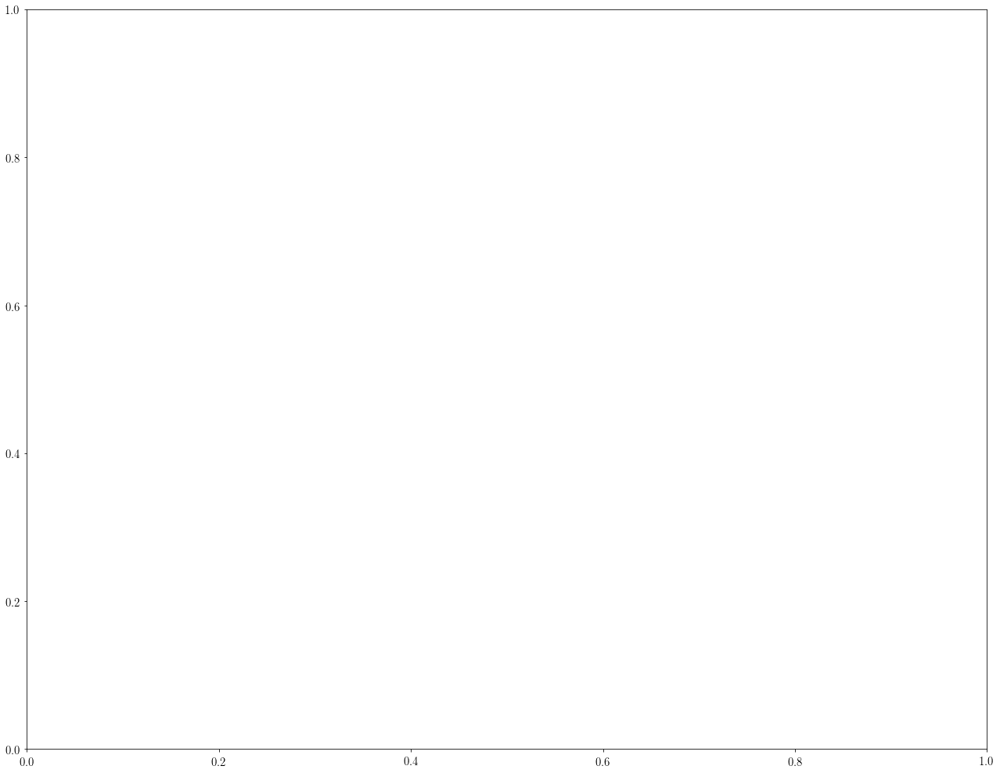

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


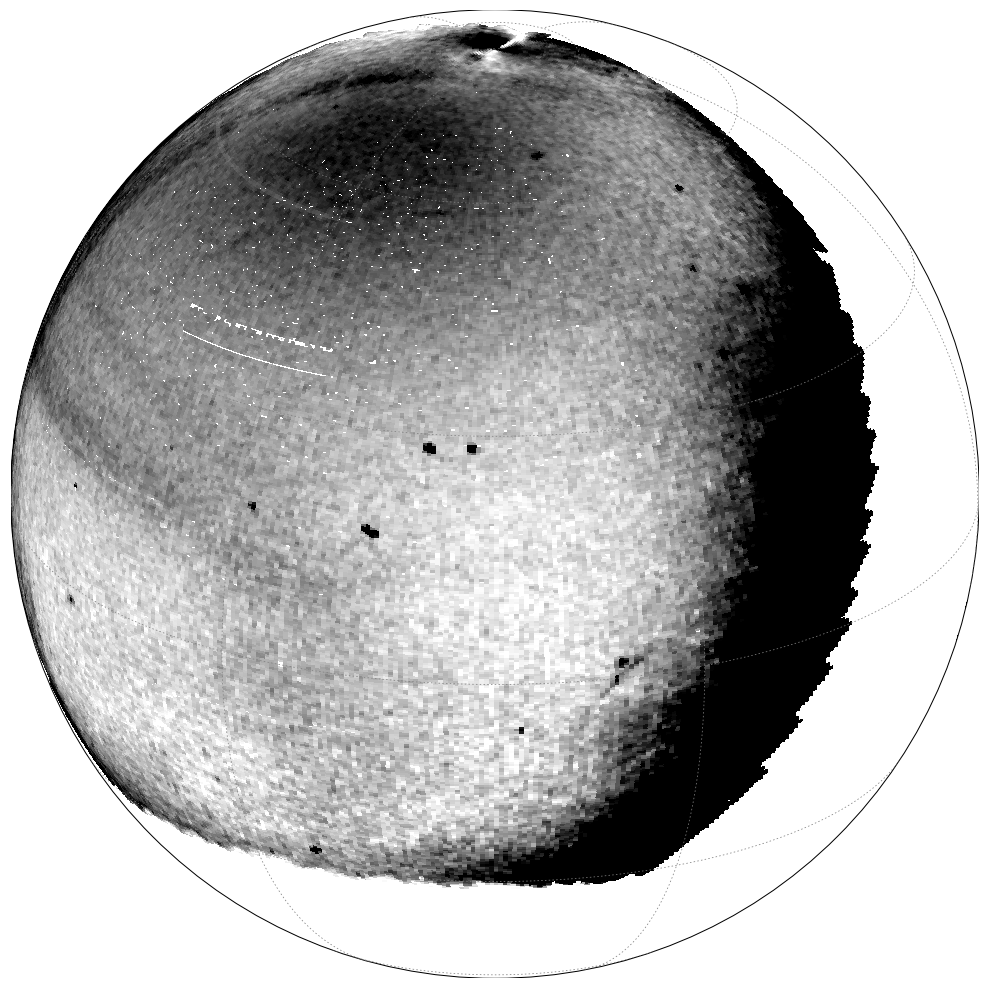

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


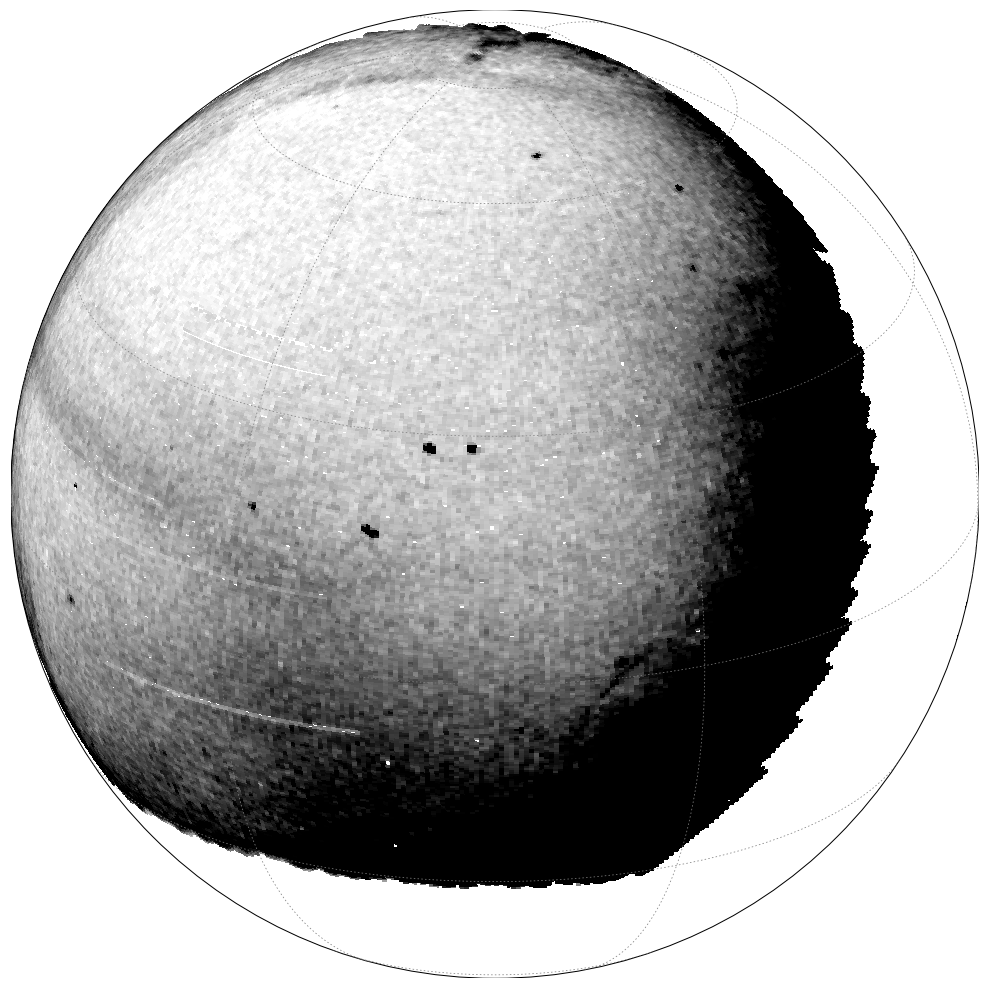

In [145]:
reload(plot_density)
reload(streamlib)

stream = 'Lethe'

# mw_streams = galstreams.MWStreams(verbose=False)
center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
if center[0] > 180:
    center = (center[0] - 360, center[1])
print center
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print mu

vmin = -4
vmax = 2

# data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40)
bkg = plot_density.fit_background(data, center=center, coords='cel', sigma=0.2, deg=5)
smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords='cel', proj='ortho', xsize=600)
smap = plot_density.plot_density(data, 0, center=center, vmax=10, coords='cel', proj='ortho', xsize=600)

# smap = plot_density.plot_density(data, bkg, center=center, vmin=vmin, vmax=vmax, coords='cel', proj='ortho', xsize=600)
# plot_density.plot_stream_list(smap, [stream])


/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


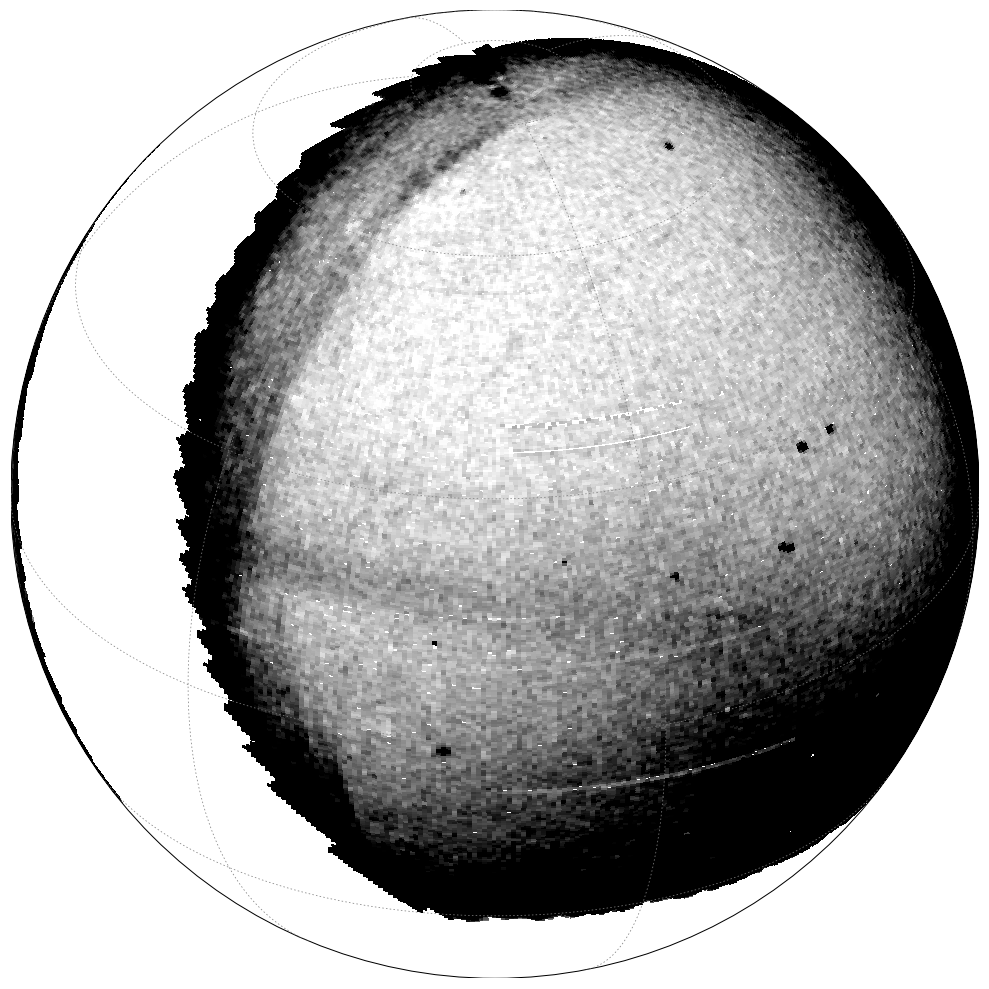

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


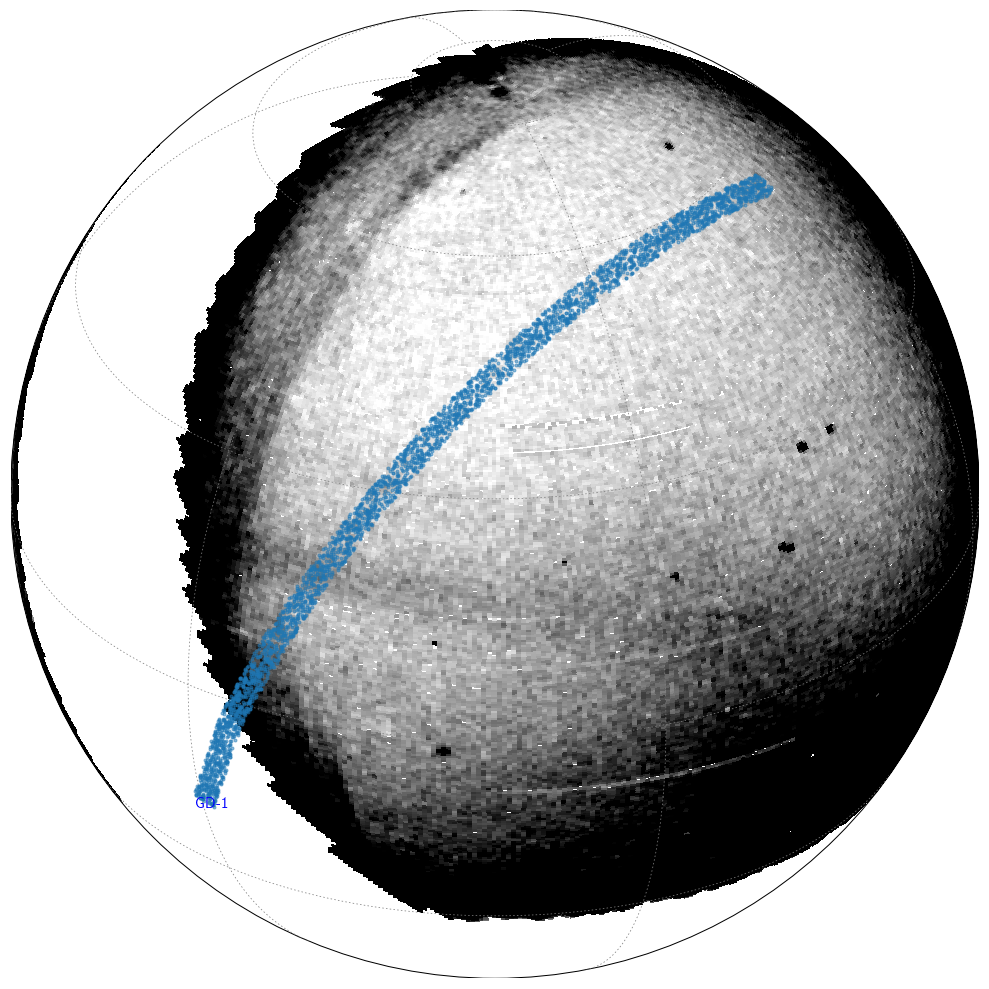

In [23]:
stream = 'GD-1'

# mw_streams = galstreams.MWStreams(verbose=False)
center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])

data, bkg = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40)
smap = plot_density.plot_density(data, bkg, center=center, vmax=8, coords='cel', proj='ortho', xsize=600)

smap = plot_density.plot_density(data, bkg, center=center, vmax=8, coords='cel', proj='ortho', xsize=600)
plot_density.plot_stream_list(smap, [stream])


/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


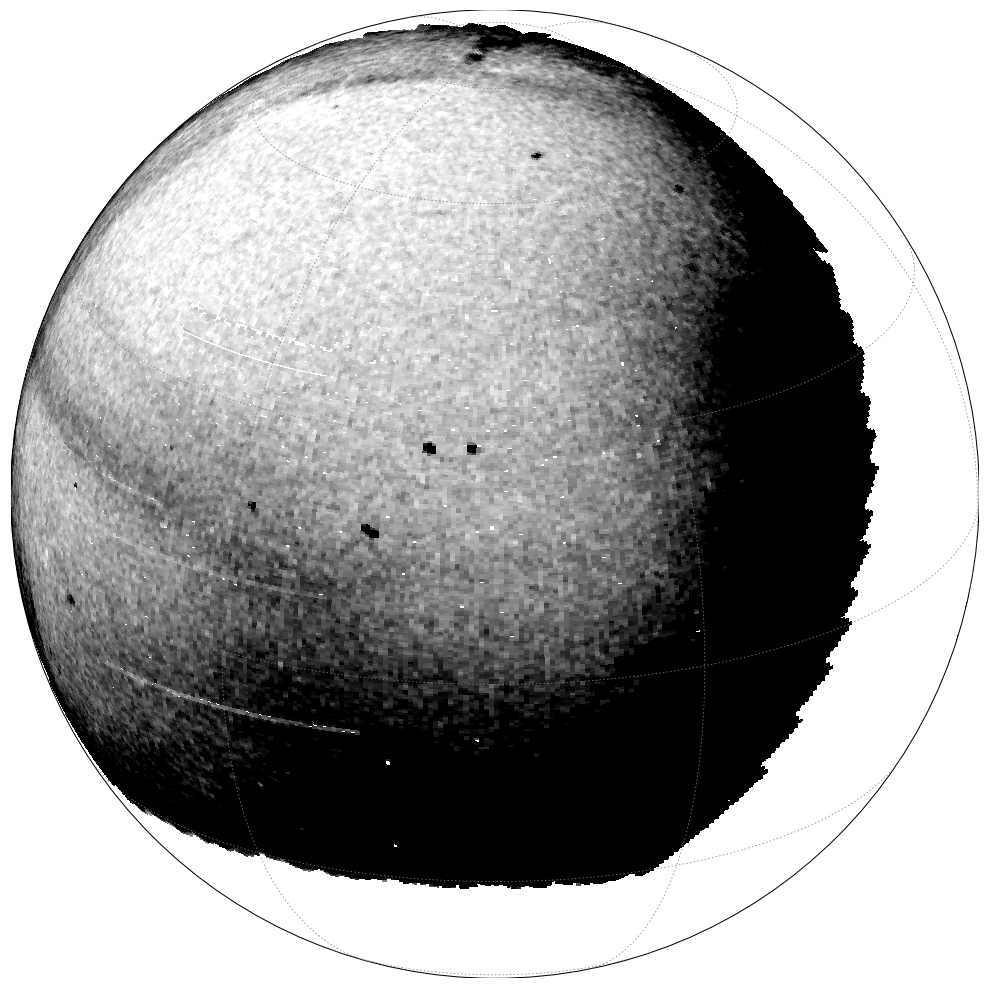

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


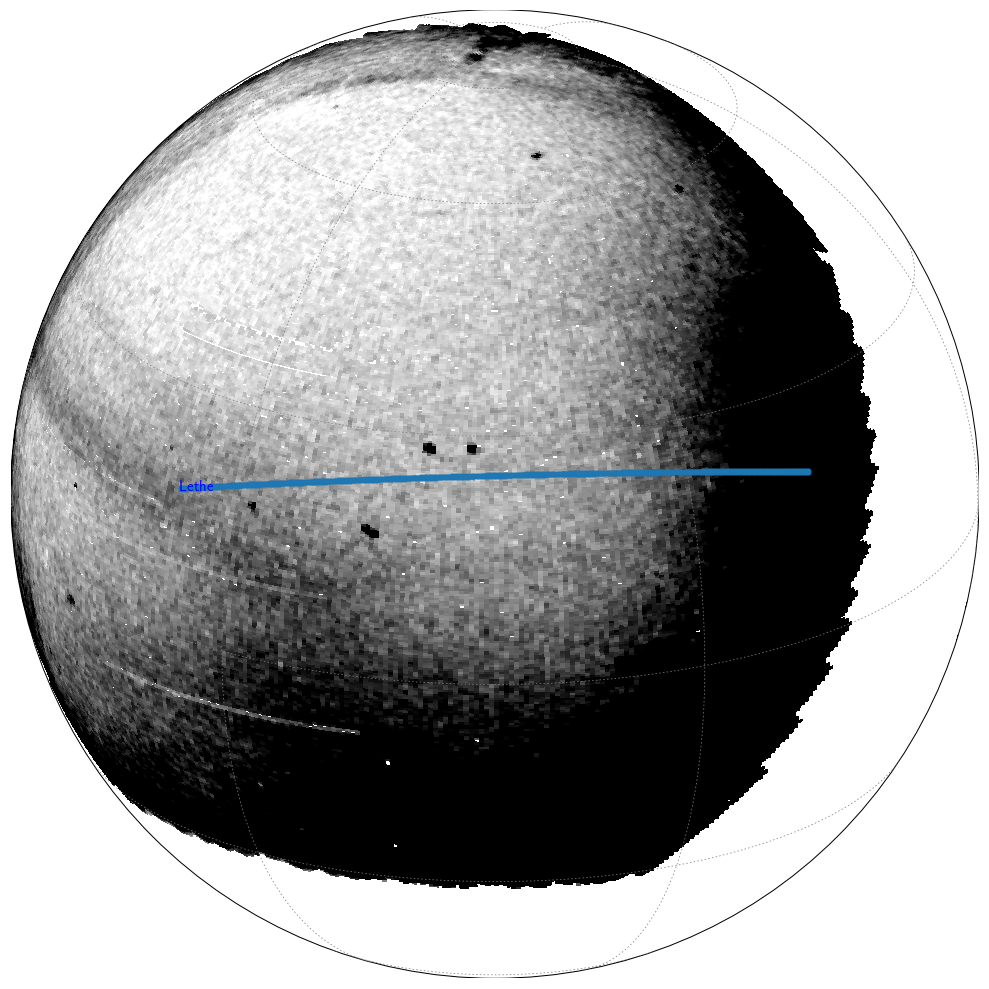

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


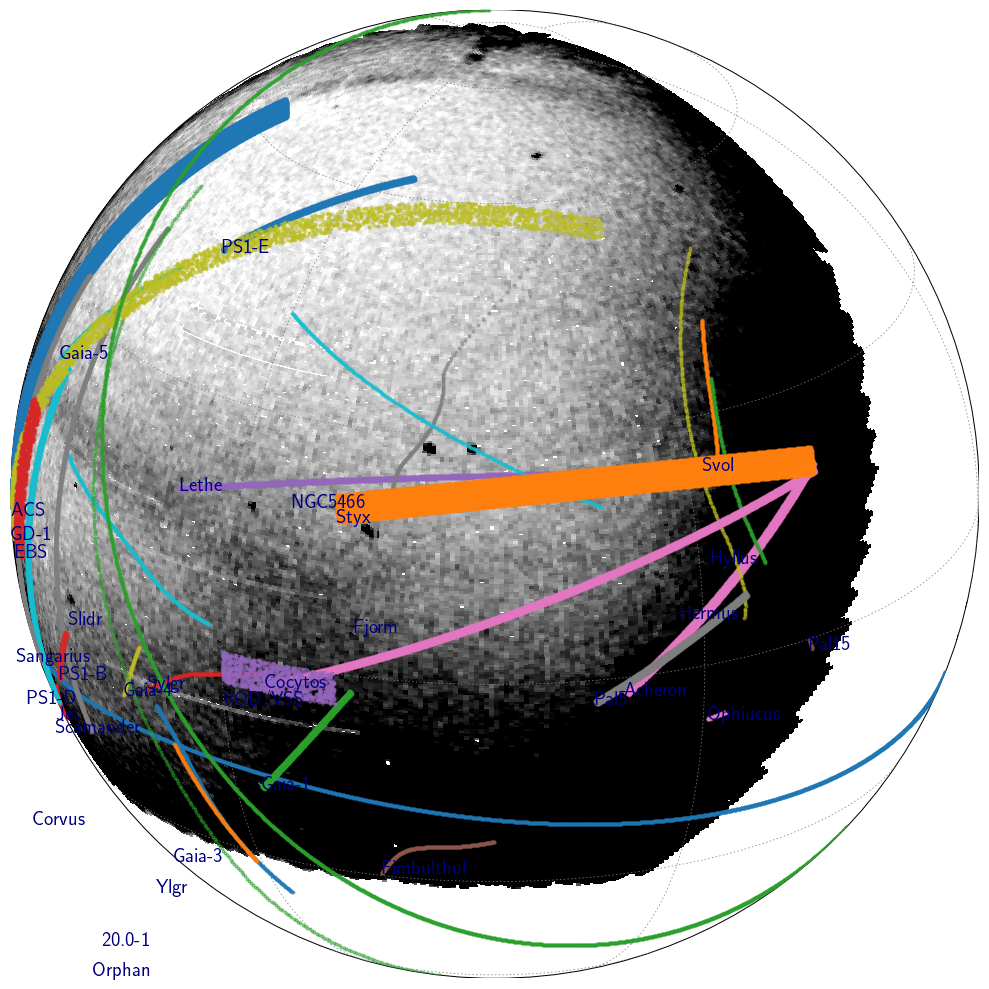

In [36]:
reload(plot_density)
# smap = plot_density.plot_density(data, bkg, center=center, vmax=10, coords='cel', proj='ortho', xsize=600)
# plot_density.plot_streams(smap, mu, 50)
plot_density.plot_stream('Lethe', hpxcube, fracdet, modulus)
plt.savefig('../plots/ps1/v2/lethe/lethe_all_labels.png')

/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


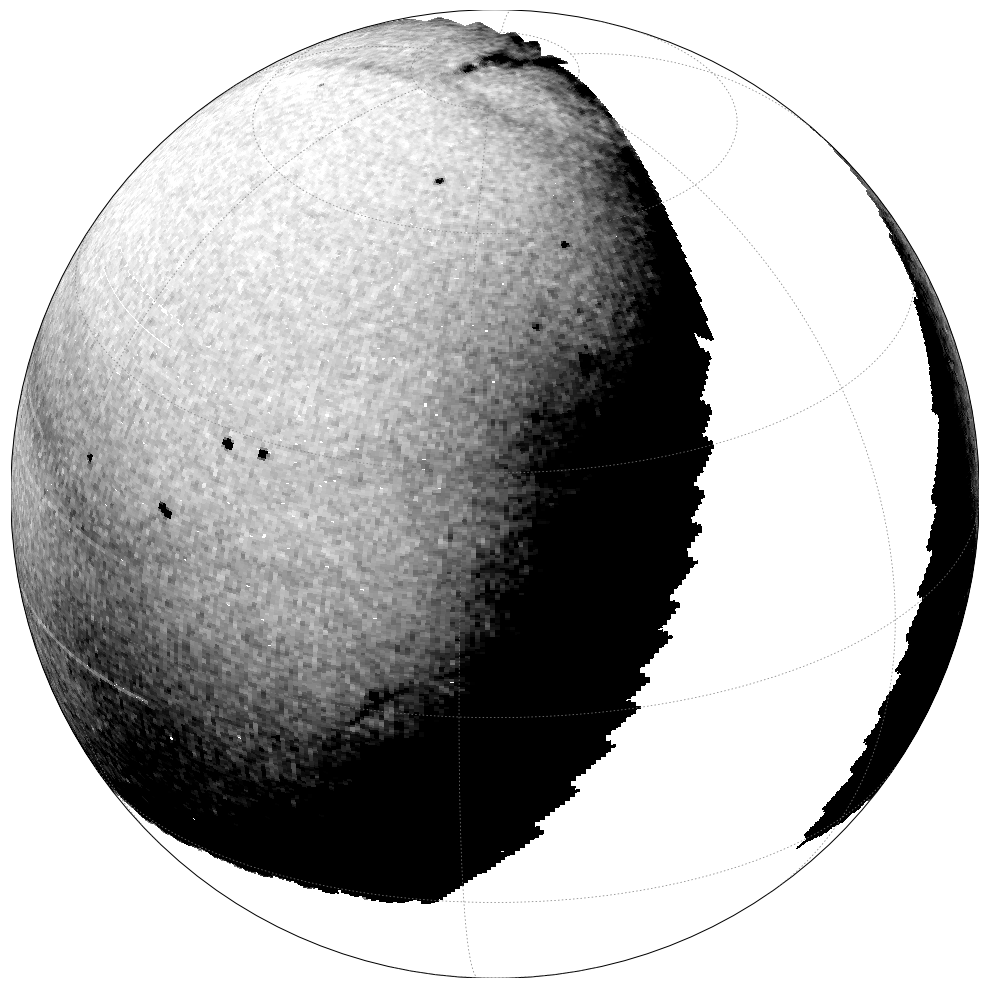

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


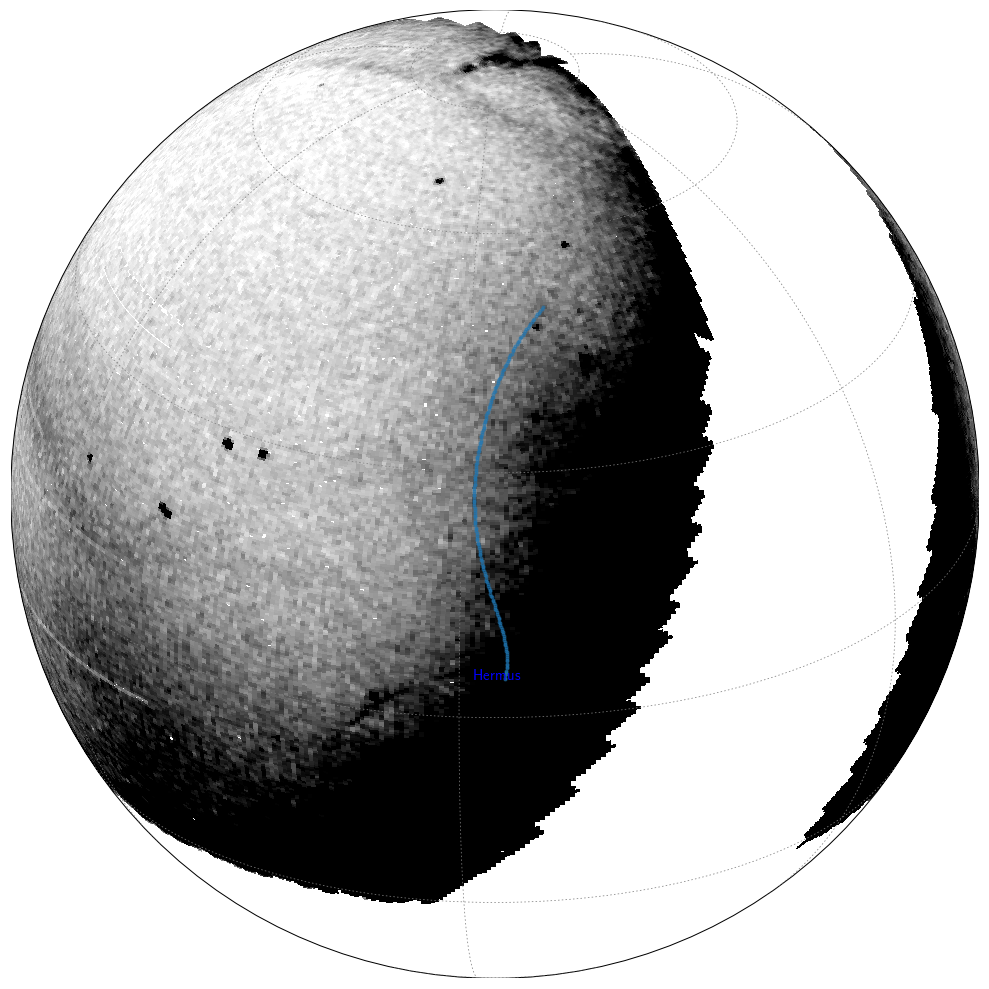

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


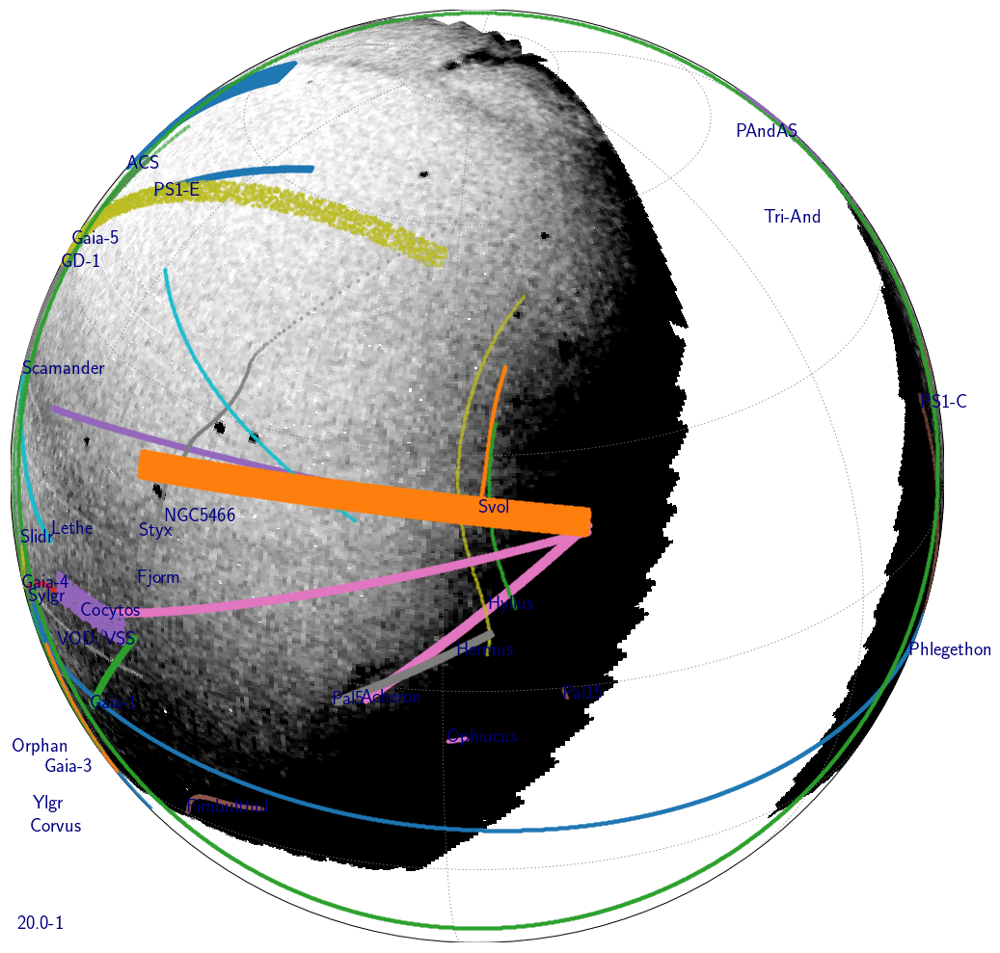

In [27]:
stream = 'Hermus'
vmax = 10

# mw_streams = galstreams.MWStreams(verbose=False)
center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])

data, bkg = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40)
smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords='cel', proj='ortho', xsize=600)

smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords='cel', proj='ortho', xsize=600)
plot_density.plot_stream_list(smap, [stream])

smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords='cel', proj='ortho', xsize=600)
plot_density.plot_streams(smap, mu, 50)


/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


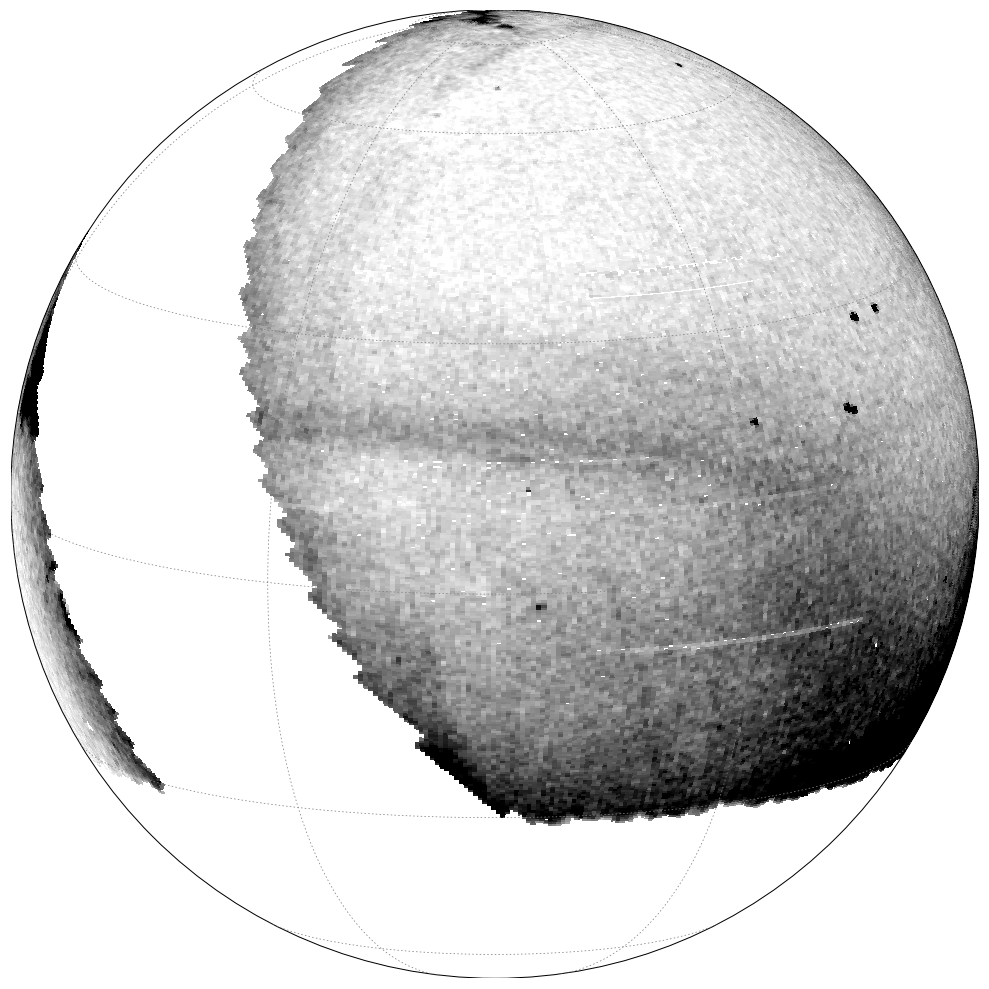

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


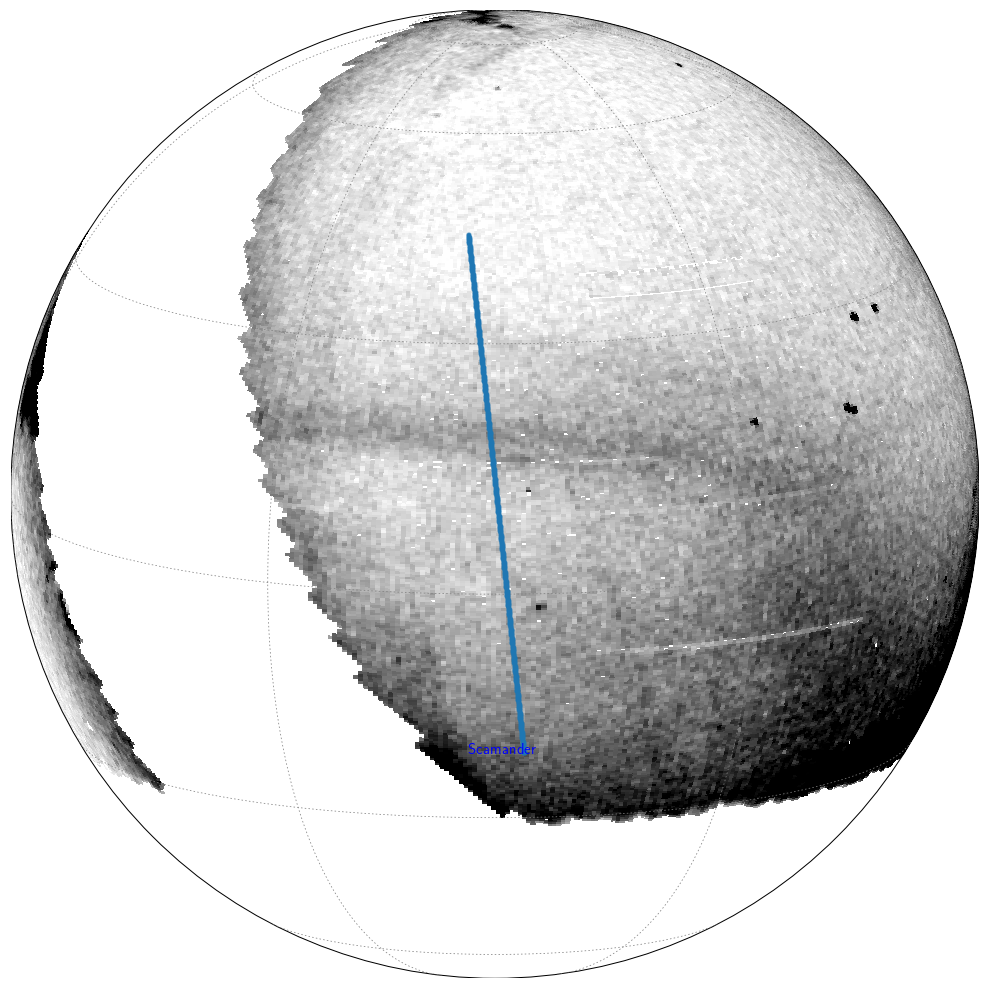

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


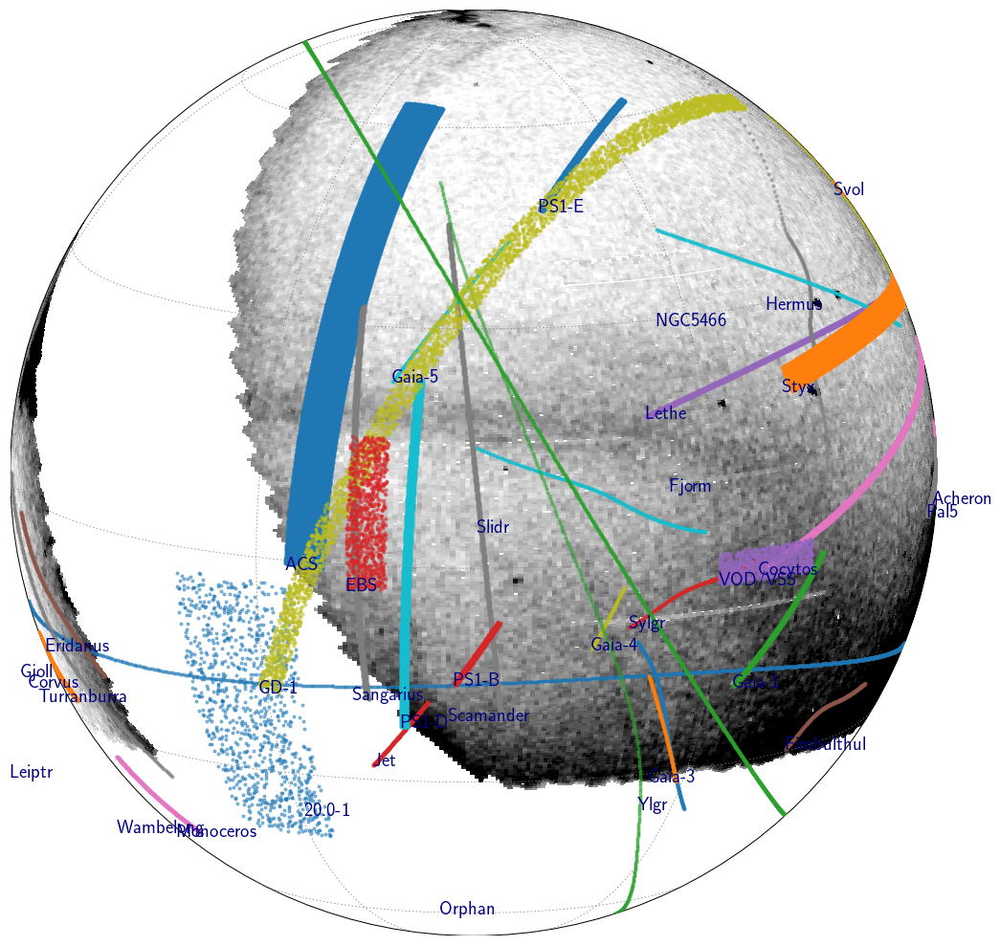

In [26]:
stream = 'Scamander'

# mw_streams = galstreams.MWStreams(verbose=False)
center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])

data, bkg = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40)
smap = plot_density.plot_density(data, bkg, center=center, vmax=8, coords='cel', proj='ortho', xsize=600)

smap = plot_density.plot_density(data, bkg, center=center, vmax=8, coords='cel', proj='ortho', xsize=600)
plot_density.plot_stream_list(smap, [stream])

smap = plot_density.plot_density(data, bkg, center=center, vmax=8, coords='cel', proj='ortho', xsize=600)
plot_density.plot_streams(smap, mu, 50)


(188.4, -16.7) 15.56405256508202


/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


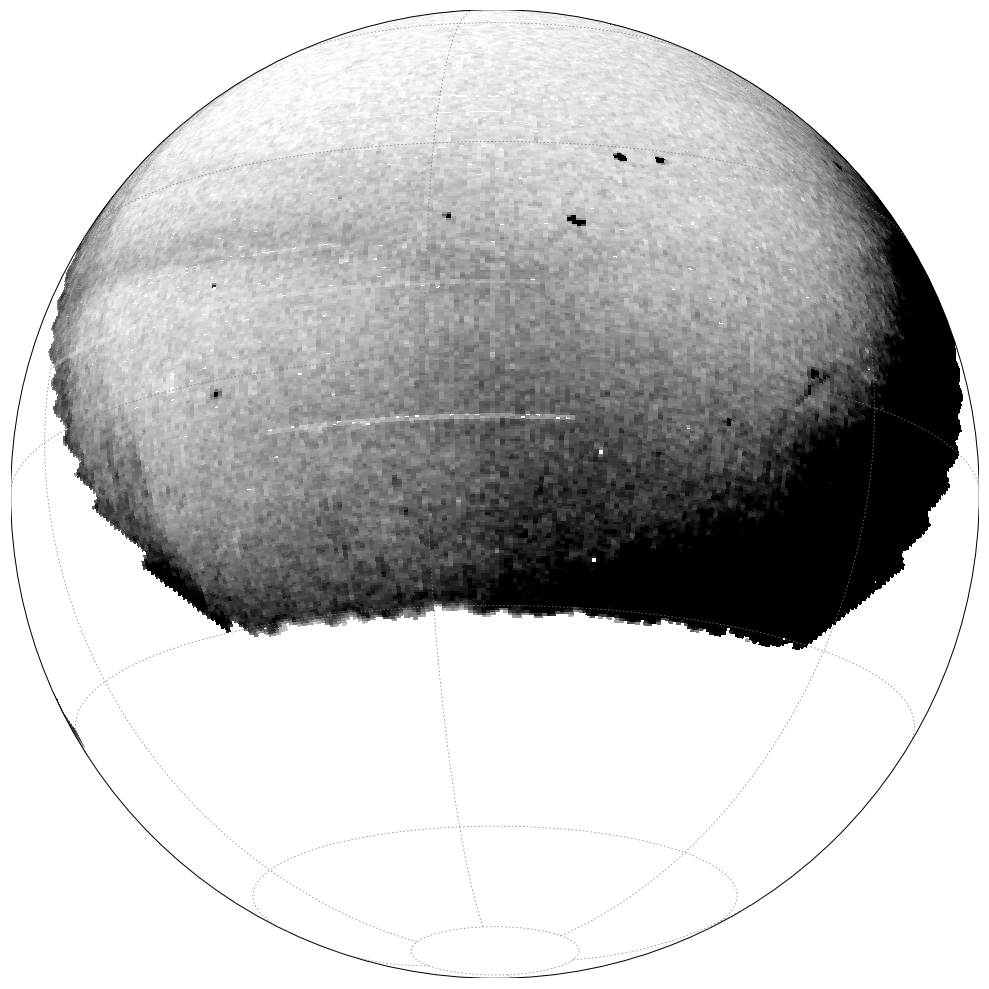

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


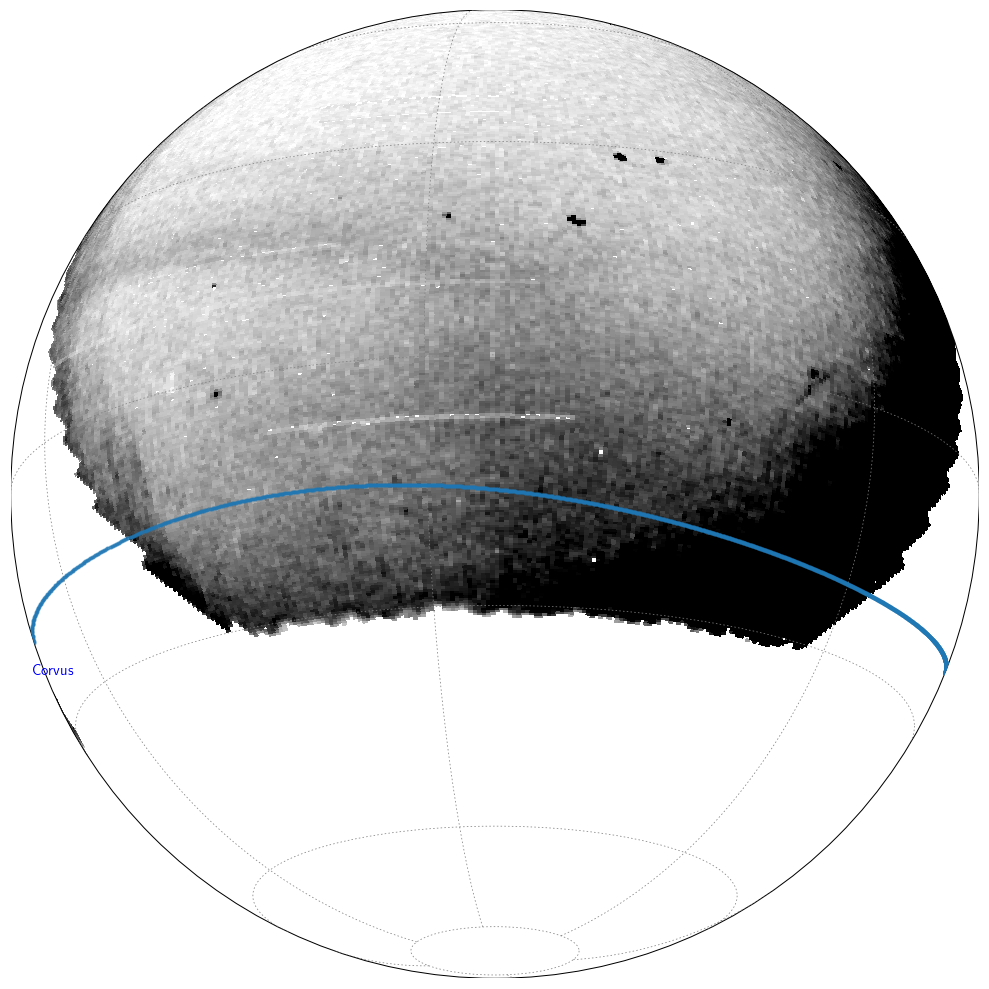

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


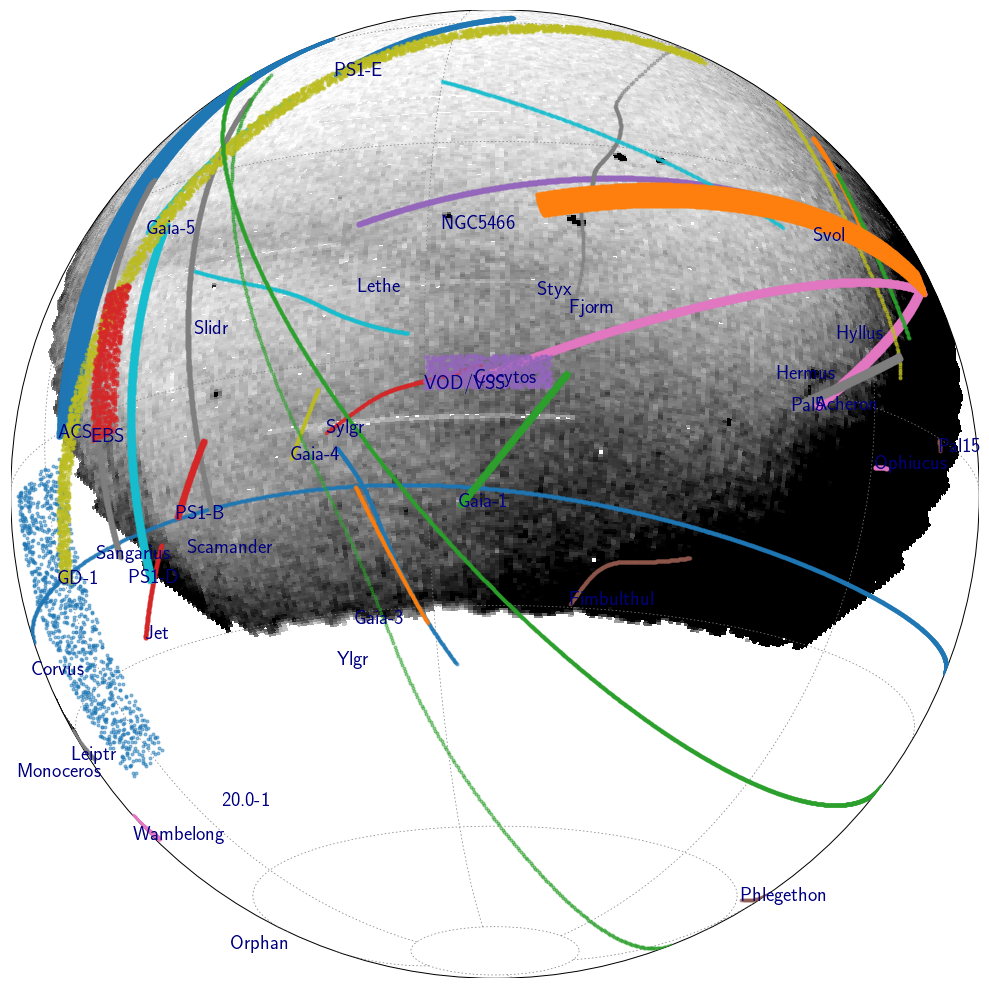

In [93]:
stream = 'Corvus'

# mw_streams = galstreams.MWStreams(verbose=False)
# center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
center = (188.4, -16.7)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print center, mu

vmax=12

# data, bkg = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40)
bkg = 0
smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords='cel', proj='ortho', xsize=600)

smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords='cel', proj='ortho', xsize=600)
plot_density.plot_stream_list(smap, [stream])

smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords='cel', proj='ortho', xsize=600)
plot_density.plot_streams(smap, mu, 50)


In [91]:
# mu = 17
# coords='gal'
# lon, lat = 0, -90

# data, bkg = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=True, center=True, sgr=False, bmax=25, cmax=40)
# smap = plot_density.plot_density(data, bkg, center=(lon,lat), vmax=6, coords=coords, proj='ortho', xsize=600, smooth=0.2)

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


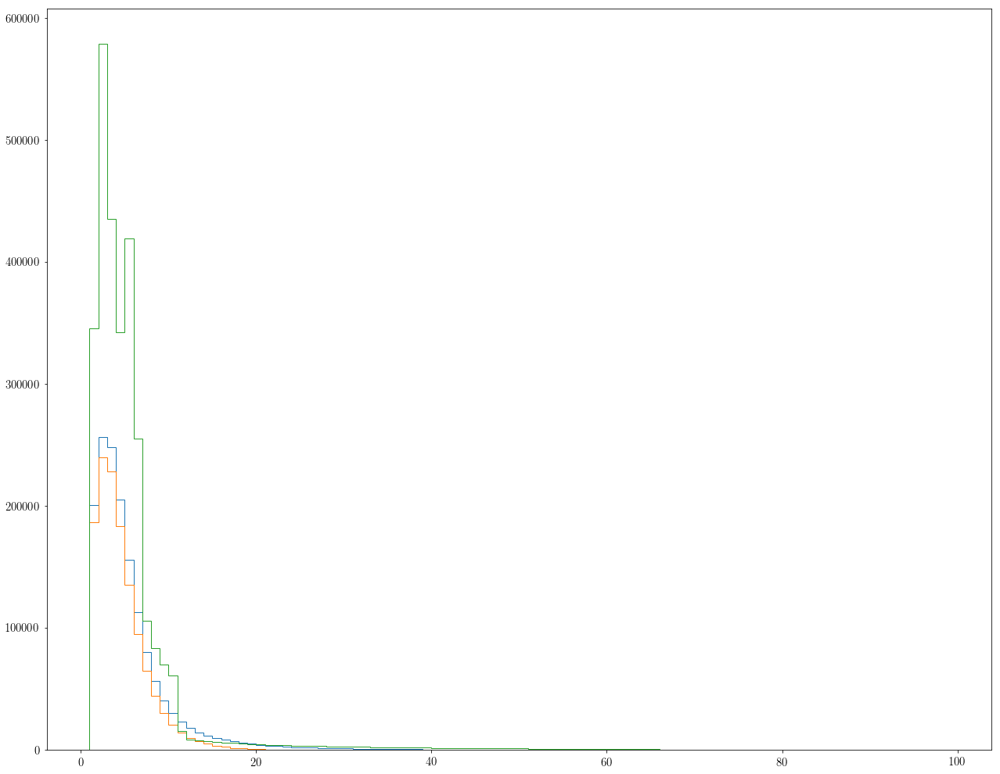

In [69]:
plt.figure()
plt.hist(data, histtype='step', bins=np.arange(1,100,1))
plt.hist(data.compressed(), histtype='step', bins=np.arange(1,100,1))
plt.hist(bkg, histtype='step', bins=np.arange(1,100,1))
plt.show()

In [84]:
# data = streamlib.prepare_data(hpxcube[:,10], fracdet, fracmin=0.5, clip=100)

# # plt.figure()

# import healpy as hp
# nside = hp.get_nside(data.mask)
# lon, lat = hp.pix2ang(nside, np.arange(hp.nside2npix(nside)), lonlat=True)

# percent = [2,95]
# vmin, vmax = np.percentile(data.compressed(), q=percent)
# print vmin, vmax

# # plt.hist(data, bins=50)

# sigma = 0.2
# data = np.clip(data, vmin, vmax)
# data.fill_value = np.ma.median(data)
# data = np.ma.array(hp.smoothing(data, sigma=np.radians(sigma), verbose=False),
#                    mask=data.mask)

# # plt.hist(data, bins=50)

# smap = skymap.core.McBrydeSkymap(parallels=False, meridians=False)

# sel = ~data.mask
# x, y = smap(lon[sel], lat[sel])
# v = data[sel]

# from polyfit2d import polyfit2d
# deg = 5
# c = polyfit2d(x, y, v, [deg, deg])

# # Evaluate the polynomial
# from numpy.polynomial import polynomial
# x, y = smap(lon, lat)
# bkg = polynomial.polyval2d(x, y, c)
# bkg = np.ma.array(bkg, mask=data.mask, fill_value=np.nan)

# # plt.hist(bkg, bins=50)

# # plt.hist(data-bkg, bins=50)

# # plt.show()


/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


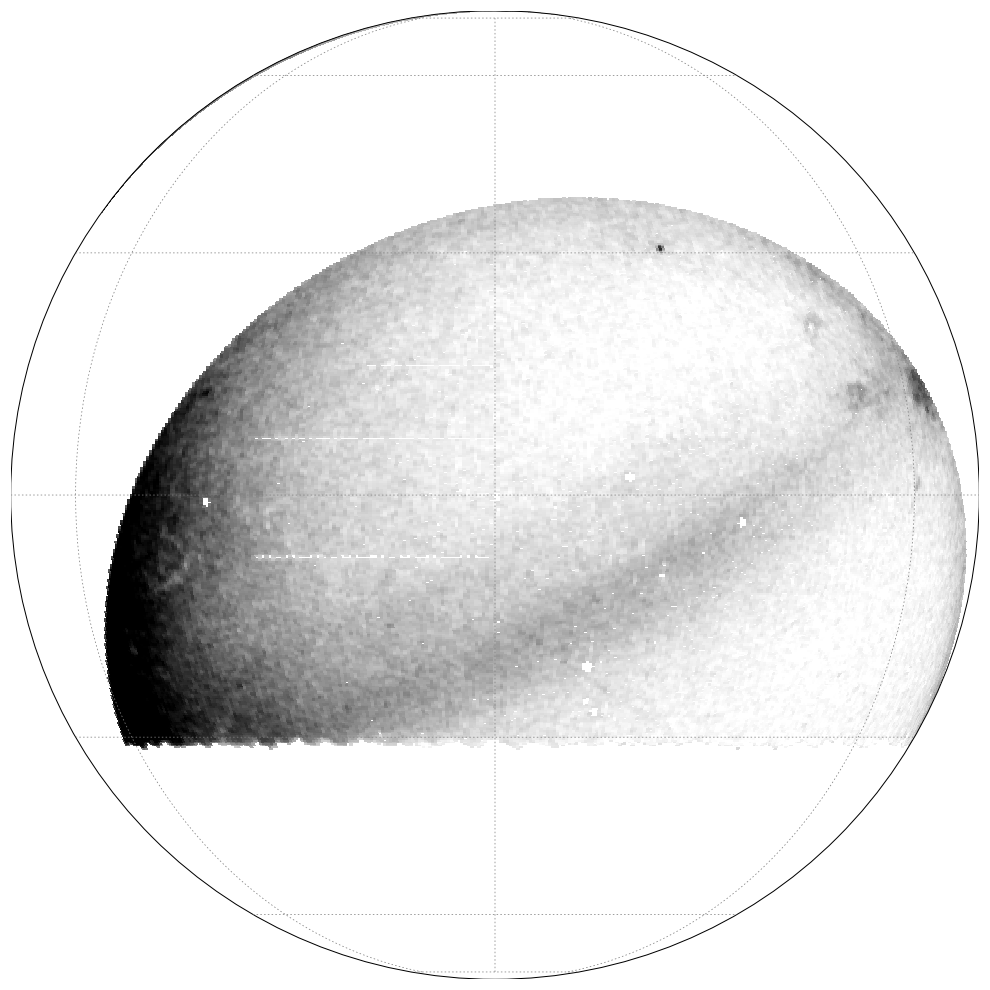

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


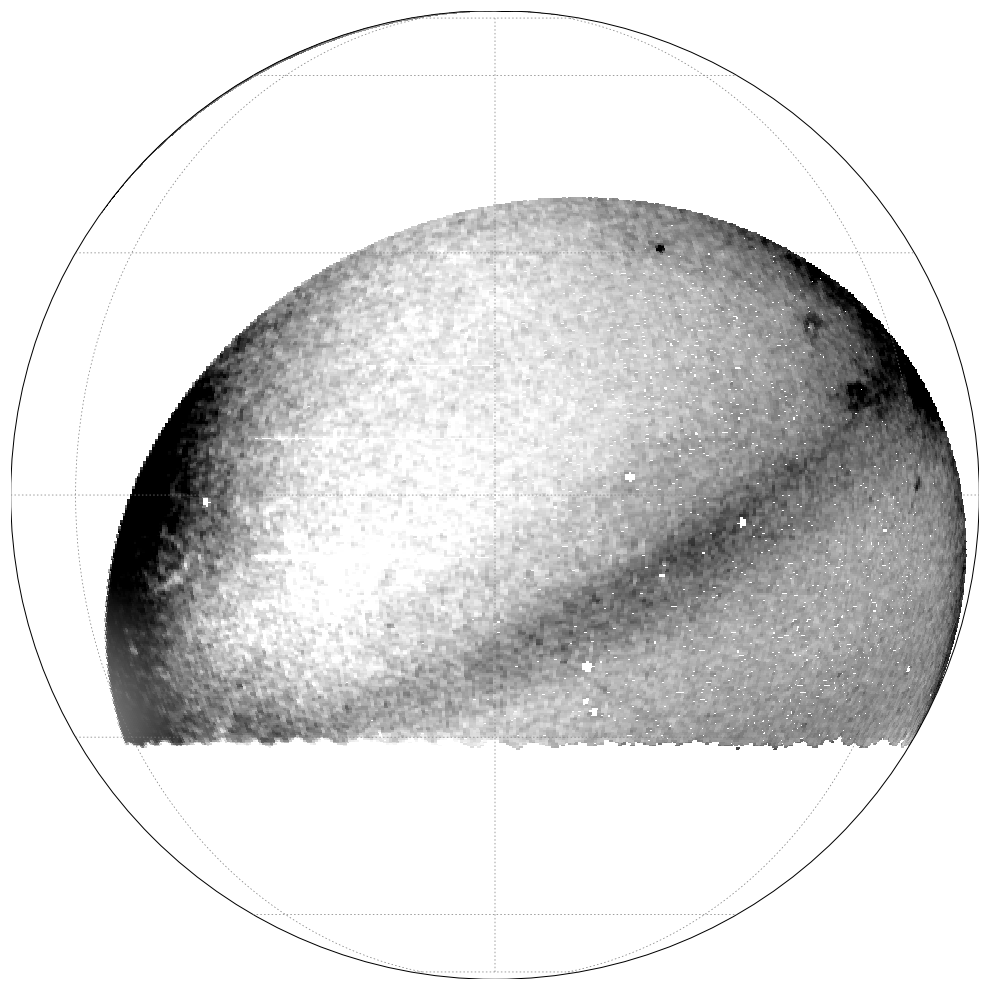

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


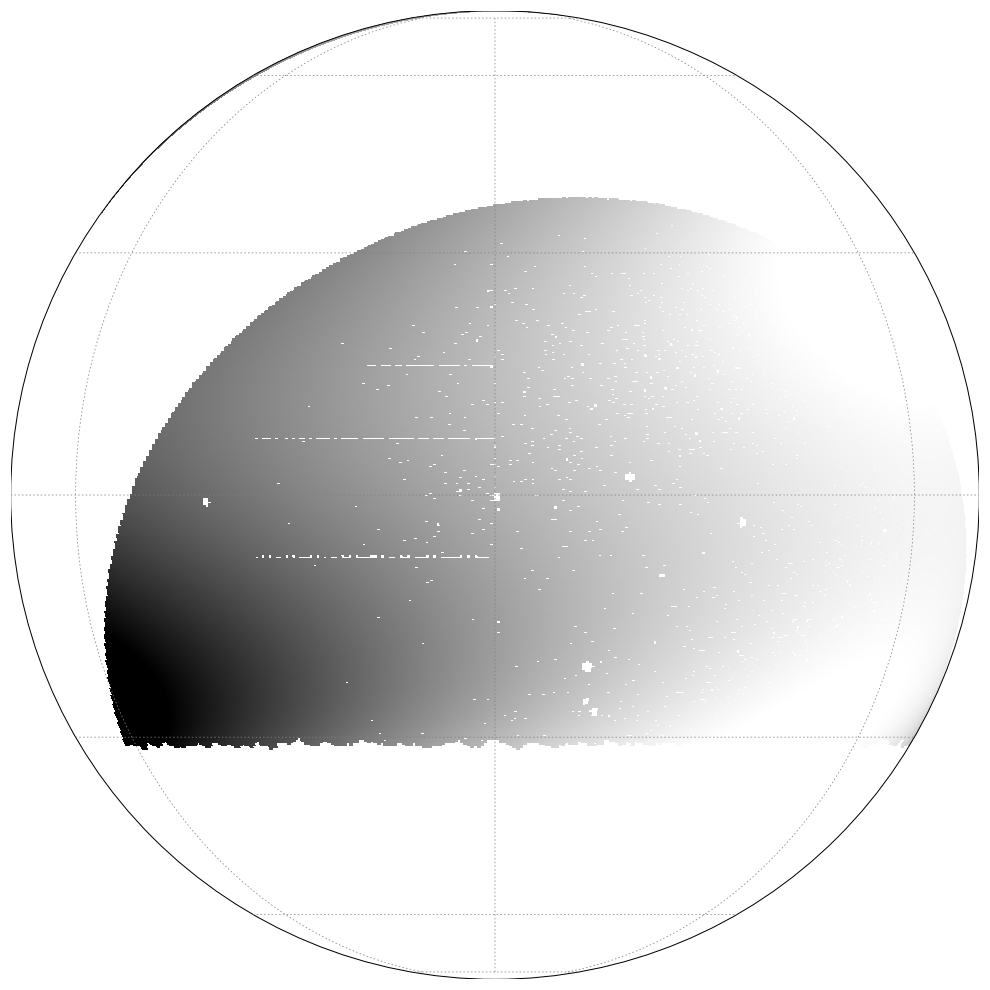

In [83]:
plt.figure()
smap = skymap.Skymap(projection='ortho', lon_0=0, lat_0=0, celestial=False)
smap.draw_hpxmap(data, cmap='binary')

plt.figure()
smap = skymap.Skymap(projection='ortho', lon_0=0, lat_0=0, celestial=False)
smap.draw_hpxmap(data-bkg, cmap='binary')

plt.figure()
smap = skymap.Skymap(projection='ortho', lon_0=0, lat_0=0, celestial=False)
smap.draw_hpxmap(bkg, cmap='binary')

plt.show()

/Users/nora/projects/stream_search/code/polyfit2d.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  c = np.linalg.lstsq(vander, f)[0]
/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


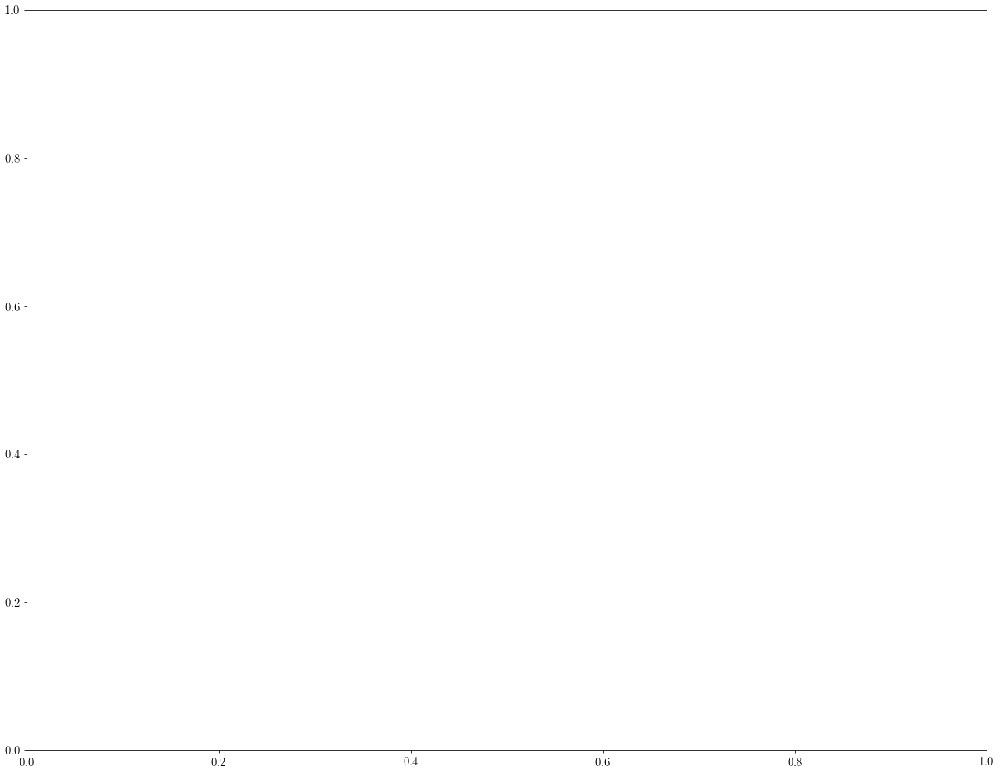

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


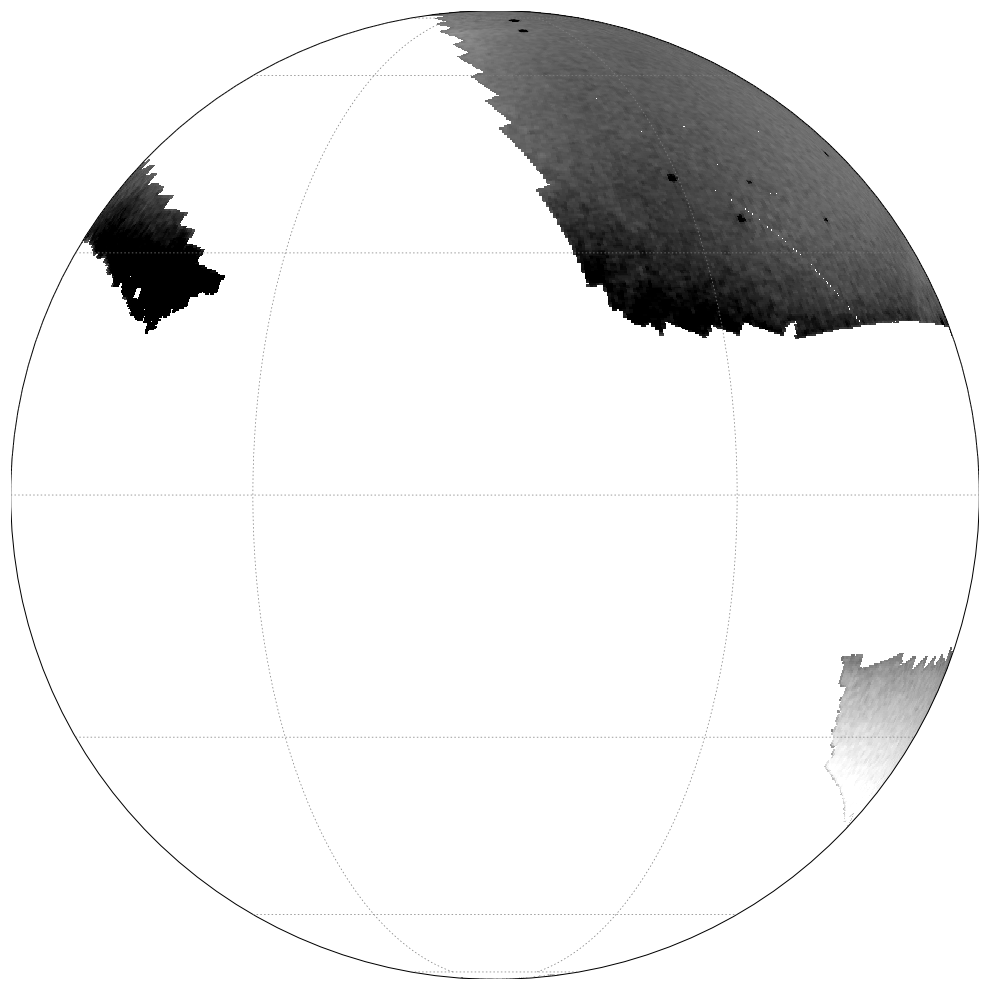

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


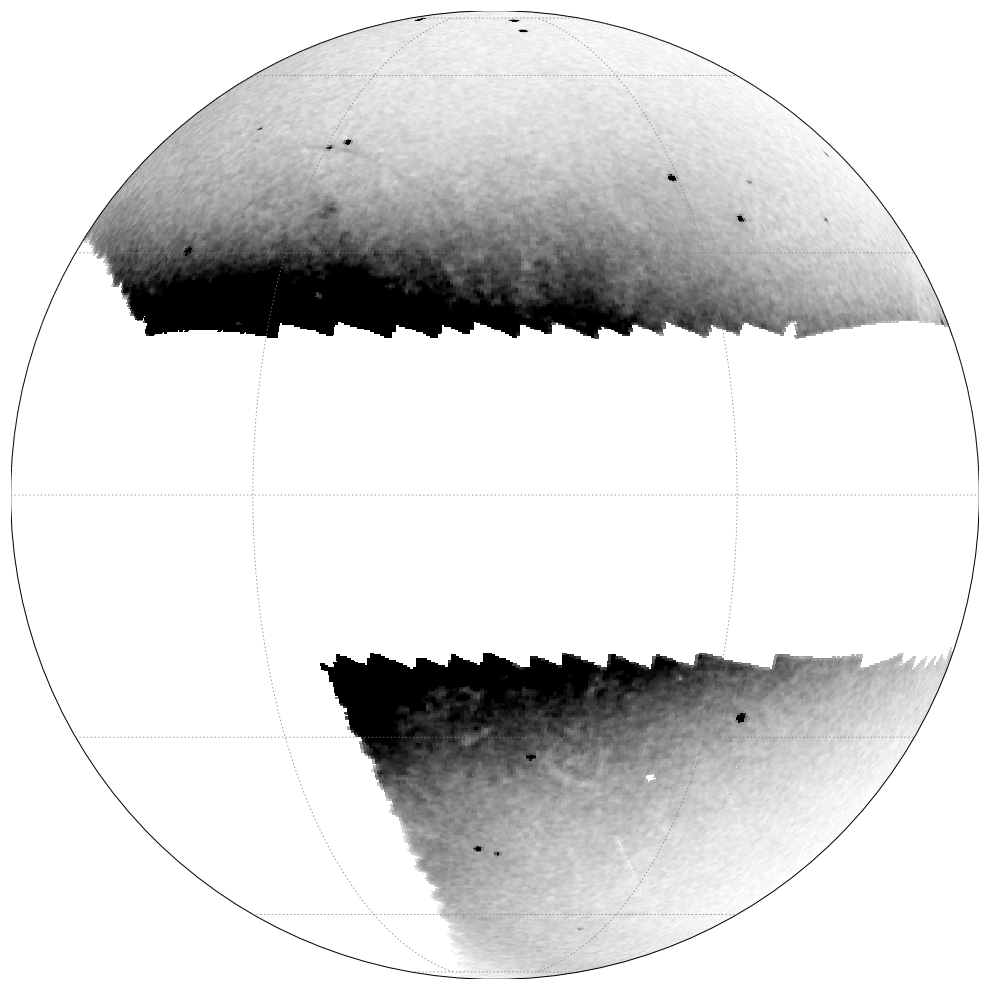

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


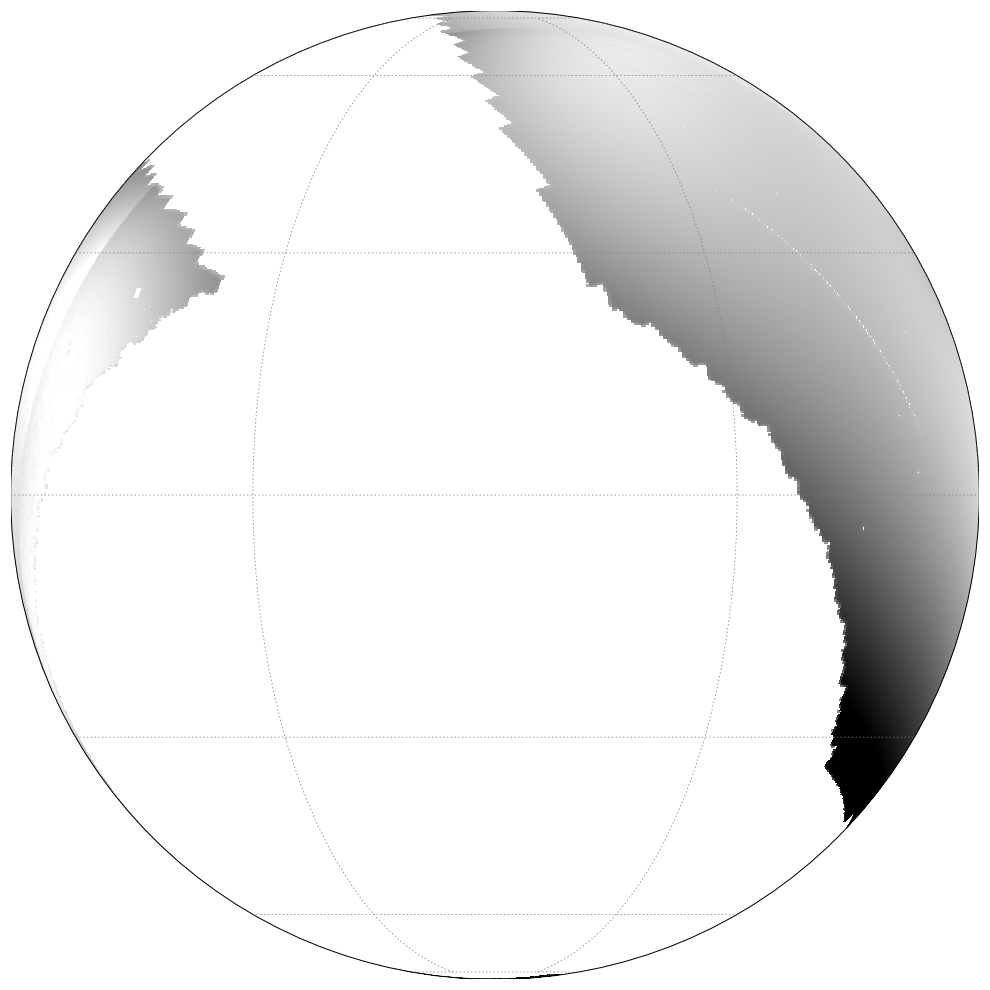

In [120]:
reload(plot_density)
# data = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40)
bkg = plot_density.fit_background(data, center=(30,0), coords='gal')

from skymap.utils import cel2gal, gal2cel
galpix = hp.ang2pix(nside, *gal2cel(lon, lat), lonlat=True)

plt.figure()
smap = skymap.Skymap(projection='ortho', lon_0=30, lat_0=0, celestial=False)
smap.draw_hpxmap((data-bkg)[galpix], cmap='binary', smooth=0.2)

plt.figure()
smap = skymap.Skymap(projection='ortho', lon_0=30, lat_0=0, celestial=False)
smap.draw_hpxmap(data[galpix], cmap='binary', smooth=0.2)

plt.figure()
smap = skymap.Skymap(projection='ortho', lon_0=30, lat_0=0, celestial=False)
smap.draw_hpxmap(bkg[galpix], cmap='binary', smooth=0.2)

plt.show()

(332.5981729388807, 14.981714155820441) 16.202746241412996


/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)
/Users/nora/projects/stream_search/code/plot_density.py:136: RuntimeWarning: invalid value encountered in log10
  return 5. * (np.log10(np.array(distance) * 1.e3) - 1.)


/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


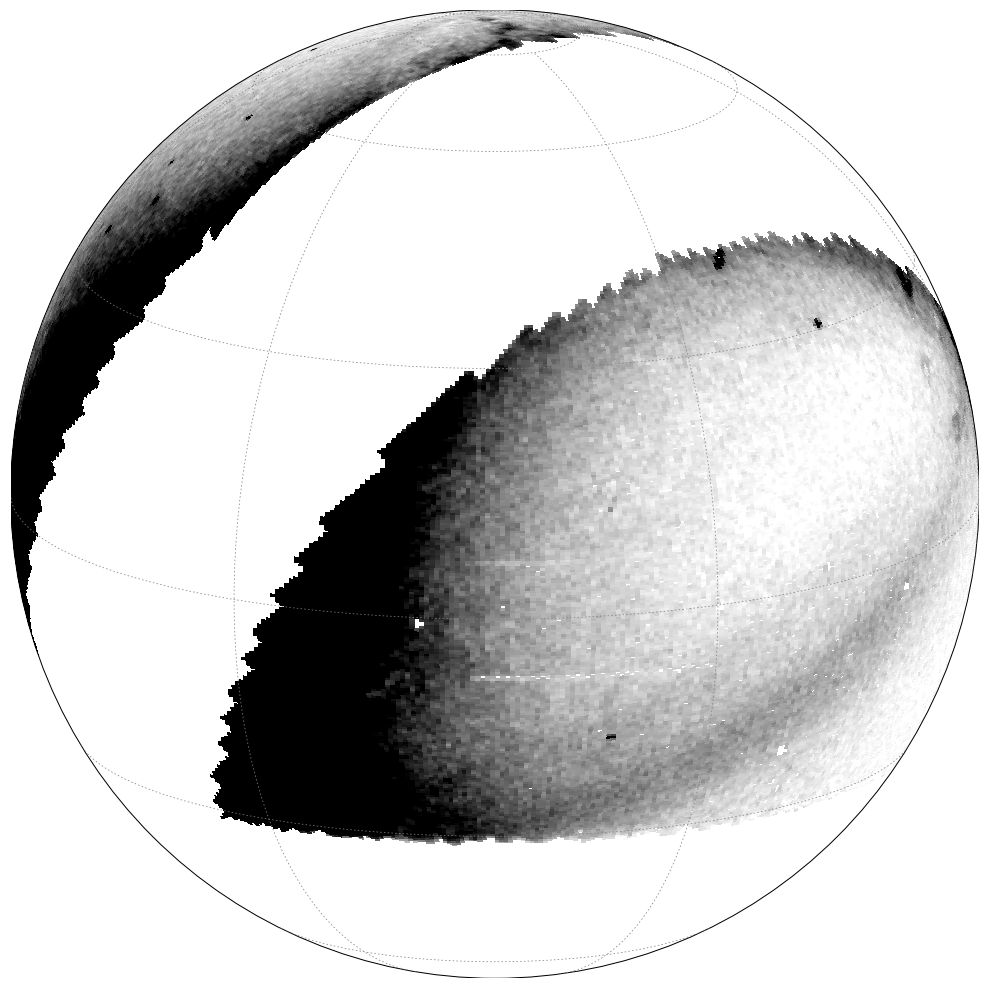

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


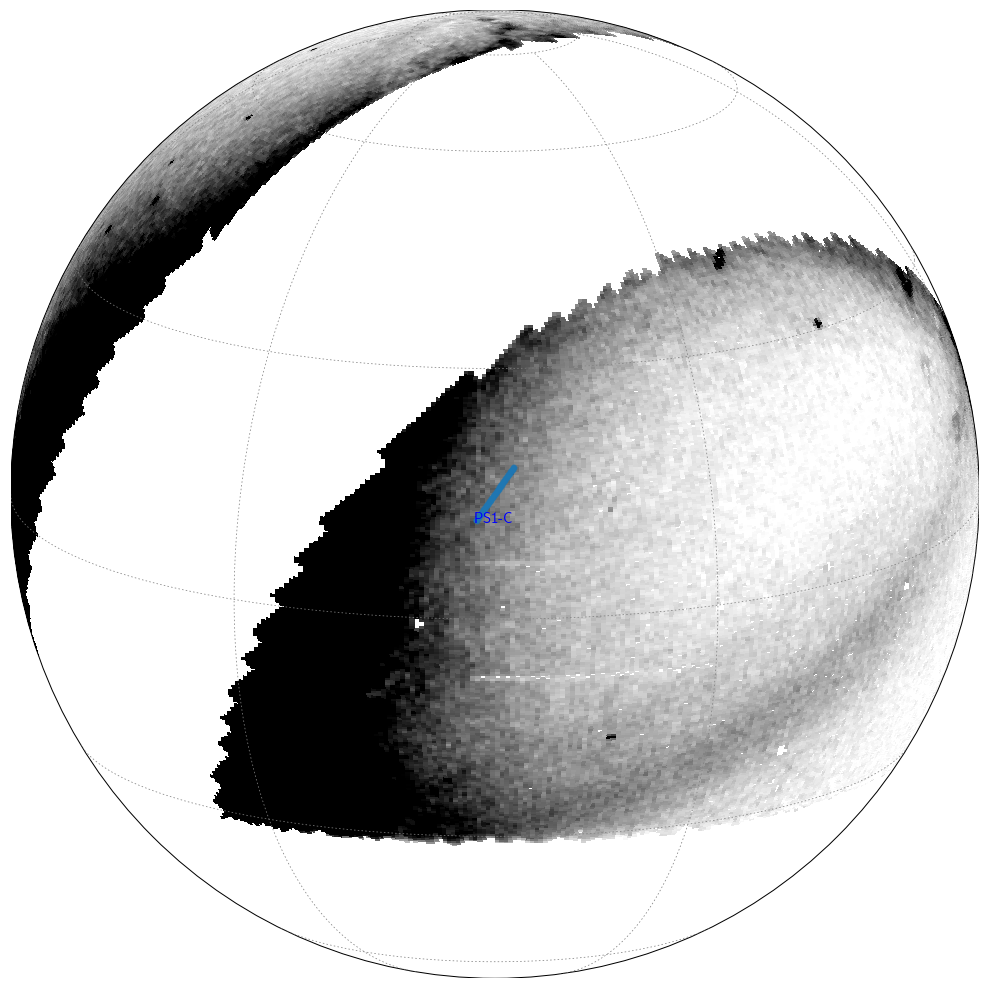

/Users/nora/anaconda2/envs/streams2.7/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


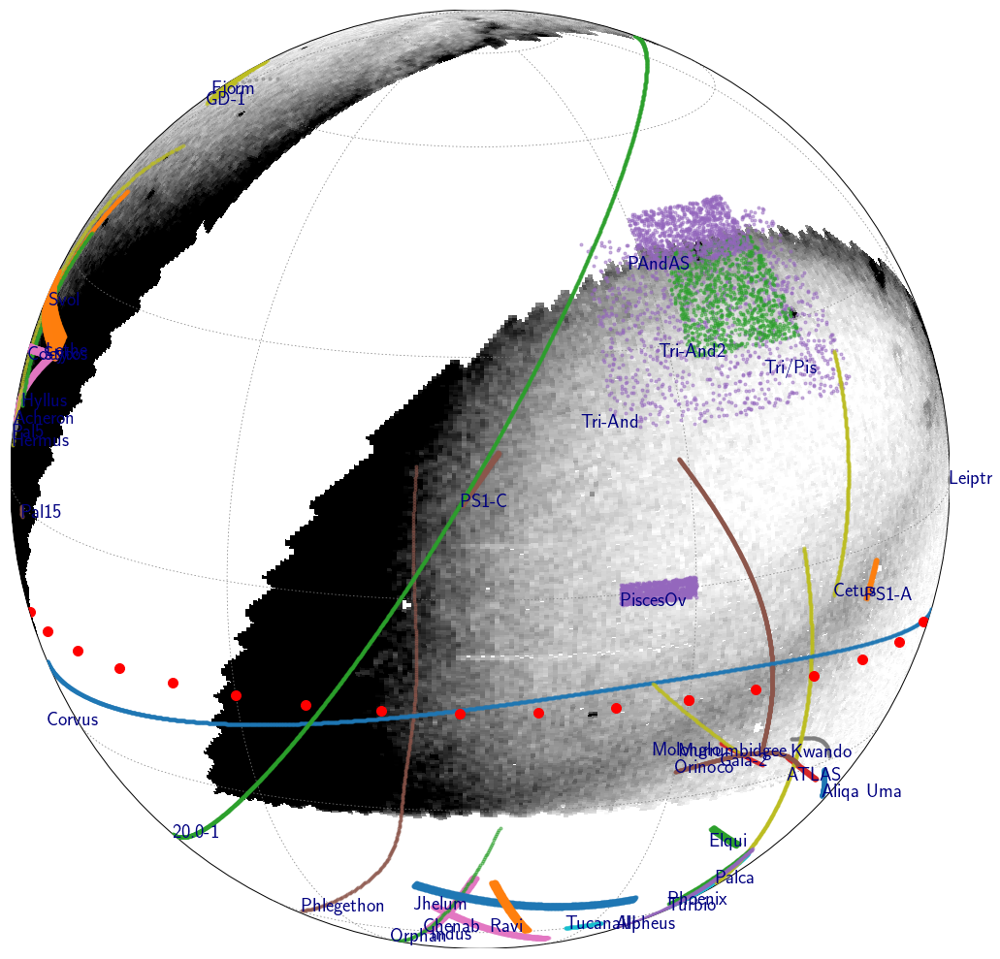

In [101]:
stream = 'PS1-C'

# mw_streams = galstreams.MWStreams(verbose=False)
center = (mw_streams[stream].ra.mean(), mw_streams[stream].dec.mean())
# center = (296+30, -30+30)
mu = plot_density.dist2mod(mw_streams[stream].Rhel[0])
print center, mu

vmax=12

# data, bkg = plot_density.prepare_hpxmap(mu, hpxcube, fracdet, modulus, clip=100, plane=False, center=False, sgr=False, bmax=25, cmax=40)
bkg = 0
smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords='cel', proj='ortho', xsize=600)

smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords='cel', proj='ortho', xsize=600)
plot_density.plot_stream_list(smap, [stream])

smap = plot_density.plot_density(data, bkg, center=center, vmax=vmax, coords='cel', proj='ortho', xsize=600)
plot_density.plot_streams(smap, mu, 50)

x = np.arange(0, 370, 10)
y = np.full_like(x, -15)
x, y = smap(x, y)
smap.plot(x, y, 'r.', ms=20)